# This notebook is used for RV illustrations. 
## Created by Chenyang Ji in 2024.11.28 as plot_rv.ipynb.
## Modified by Chenyang Ji in 2024.12.17 for paper.
---
### Containing four situations:
1. Only photon noises, including Poisson noise and read noise.
2. Only cal-sci contamination, without photon noise and sci-sci contamination.
3. Only sci-sci contamination, without photon noise and sci-sci contamination.
4. CHORUS setting, including photon noises and cross-contamination according to instrumental setup.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
pwd = os.path.dirname(os.path.abspath(os.getcwd()))
pwd

'/mnt/beegfs_data/work/joanneji/CHORUS_work'

In [3]:
# order information
order_num_blue = np.arange(86, 114, 1)
order_num_red = np.arange(60, 87, 1)
order_num = {'red': order_num_red, 'blue': order_num_blue}
order = np.concatenate([order_num['blue'], order_num['red']])

In [4]:
# define median absolute deviation
def mad(data, axis=None):
    median = np.median(data, axis=axis)
    # make median into a vector according to the axis
    if axis is not None:
        median = np.expand_dims(median, axis=axis)
    return np.median(np.abs(data - median), axis=axis)

a = [[1, 2, 3], [4, 6, 7]]
mad(a, axis=1)

array([1., 1.])

In [5]:
# a = np.ones((100, len(order_num_red), 3))
a = np.array([[[1, 2], [2, 3] ,[3, 4]],
     [[5, 6], [7, 8] ,[9, 0]]])
print(np.shape(a), a[0, :, :])
# Split the array along the last axis and concatenate
# a1 = np.concatenate([a[:, :, i] for i in [range(2)]], axis=1)
a1 = np.hstack([a[:, :, i] for i in range(2)])
# should be (100, 27*3)
a2 = np.median(a1, axis=1)
print(a1)
print(a2)

(2, 3, 2) [[1 2]
 [2 3]
 [3 4]]
[[1 2 3 2 3 4]
 [5 7 9 6 8 0]]
[2.5 6.5]


## 0. Basic settings

### 0.1 instrumental setup & CCD layout

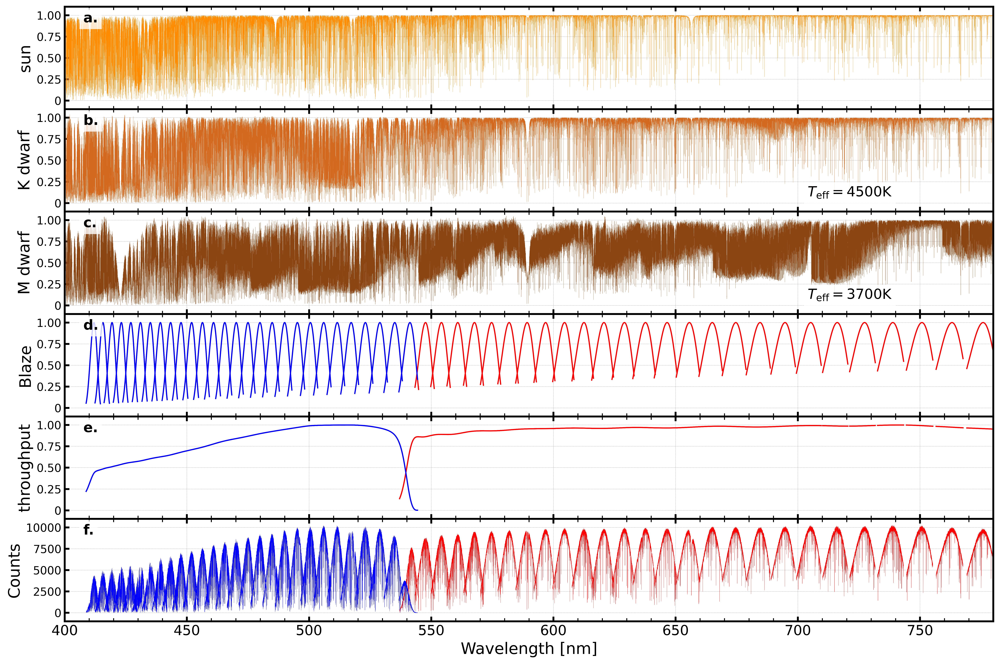

In [10]:
# this plot contains template of the sun, K, normalized Blaze, normalized throughtput, simulated spectrum
# template
sun = os.path.join(pwd, f"input/sun.npz")
Kdwarf = os.path.join(pwd, f"input/4500K.npz")
Mdwarf = os.path.join(pwd, f"input/3700M.npz")

# normalized blaze, throughput, and simulated spectrum
spec_red = np.load(os.path.join(pwd, f"output/synfile_nocont/snr100/120000_0_red.npz"))
spec_blue = np.load(os.path.join(pwd, f"output/synfile_nocont/snr100/120000_0_blue.npz"))

# create a plot with 6 subplots vertically
fig, ax = plt.subplots(6, 1, figsize=(15, 10), dpi=500, sharex=True, gridspec_kw={'wspace': 0, 'hspace': 0})

# plot the sun template
sun_data = np.load(sun)
ax[0].plot(sun_data['arr_0'], sun_data['arr_1'], color='darkorange', linewidth=0.1)
ax[0].set_ylabel('sun', fontsize=17)

# Add in-plot subtitle
ax[0].text(0.02, 0.95, 'a.', transform=ax[0].transAxes, fontsize=15, fontweight='bold', color='black', 
           ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

# plot the K-dwarf template
Kdwarf_data = np.load(Kdwarf)
ax[1].plot(Kdwarf_data['arr_0'], Kdwarf_data['arr_1'], color='chocolate', linewidth=0.1)
ax[1].set_ylabel('K dwarf', fontsize=17)

# Add in-plot subtitle
ax[1].text(0.02, 0.95, 'b.', transform=ax[1].transAxes, fontsize=15, fontweight='bold', color='black', 
           ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))
ax[1].text(0.8, 0.25, r"$T_{\text{eff}}=4500\mathrm{K}$", transform=ax[1].transAxes, fontsize=15, fontweight='bold', color='black', 
           ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

# plot the M-dwarf template
Mdwarf_data = np.load(Mdwarf)
ax[2].plot(Mdwarf_data['arr_0'], Mdwarf_data['arr_1'], color='saddlebrown', linewidth=0.1)
ax[2].set_ylabel('M dwarf', fontsize=17)

# Add in-plot subtitle
ax[2].text(0.02, 0.95, 'c.', transform=ax[2].transAxes, fontsize=15, fontweight='bold', color='black', 
           ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))
ax[2].text(0.8, 0.25, r"$T_{\text{eff}}=3700\mathrm{K}$", transform=ax[2].transAxes, fontsize=15, fontweight='bold', color='black', 
           ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

# plot the normalized blaze
for i in range(len(order_num_red)):
    for j in range(3):
        ax[3].plot(spec_red['wavelength'][i, j, :], spec_red['blaze'][i, j, :], color='red', linewidth=1.2)
for i in range(len(order_num_blue)):
    for j in range(3):
        ax[3].plot(spec_blue['wavelength'][i, j, :], spec_blue['blaze'][i, j, :], color='blue', linewidth=1.2)
ax[3].set_ylabel('Blaze', fontsize=17)

# Add in-plot subtitle
ax[3].text(0.02, 0.95, 'd.', transform=ax[3].transAxes, fontsize=15, fontweight='bold', color='black', 
           ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

# plot the normalized throughput
for i in range(len(order_num_red)):
    for j in range(3):
        ax[4].plot(spec_red['wavelength'][i, j, :], spec_red['throughput'][i, j, :], color='red', linewidth=1.2)
for i in range(len(order_num_blue)):
    for j in range(3):
        ax[4].plot(spec_blue['wavelength'][i, j, :], spec_blue['throughput'][i, j, :], color='blue', linewidth=1.2)
ax[4].set_ylabel('throughput', fontsize=17)

# Add in-plot subtitle
ax[4].text(0.02, 0.95, 'e.', transform=ax[4].transAxes, fontsize=15, fontweight='bold', color='black',
              ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

# plot the simulated spectrum
for i in range(len(order_num_red)):
    for j in range(3):
        ax[5].plot(spec_red['wavelength'][i, j, :], spec_red['flux'][i, j, :], color='red', linewidth=0.08)
for i in range(len(order_num_blue)):
    for j in range(3):
        ax[5].plot(spec_blue['wavelength'][i, j, :], spec_blue['flux'][i, j, :], color='blue', linewidth=0.08)
ax[5].set_ylabel('Counts', fontsize=17)

# Add in-plot subtitle
ax[5].text(0.02, 0.95, 'f.', transform=ax[5].transAxes, fontsize=15, fontweight='bold', color='black',
              ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

# Formatting for both subplots
for iax in ax[0:5]:
    iax.set_yticks(np.arange(0, 1.1, 0.25))
    iax.set_yticklabels(['0', '0.25', '0.50', '0.75', '1.00'], fontsize=15)
    iax.set_ylim(-0.1, 1.1)
    iax.set_xlim(400, 780)
    iax.set_xticks(np.arange(400, 780, 50))
    iax.set_xticklabels(np.arange(400, 780, 50), fontsize=15)
    iax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(400, 780, 10)))
    iax.tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
    iax.tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
    iax.tick_params(axis='y', labelsize=12)  # Set y-tick label size
    iax.grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

ax[5].set_yticks(np.arange(0, 11000, 2500))
ax[5].set_yticklabels(np.arange(0, 11000, 2500), fontsize=15)
ax[5].set_ylim(-1000, 11000)
ax[5].set_xlim(410, 780)
ax[5].set_xlabel('Wavelength [nm]', fontsize=17)
ax[5].set_xticks(np.arange(400, 780, 50))
ax[5].set_xticklabels(np.arange(400, 780, 50), fontsize=15)
ax[5].xaxis.set_minor_locator(plt.FixedLocator(np.arange(400, 780, 10)))
ax[5].tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
ax[5].tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
ax[5].tick_params(axis='y', labelsize=12)  # Set y-tick label size
ax[5].grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

# Add ticks on the top for both subplots (hide labels)
for iax in ax:
    iax.tick_params(axis='x', which='both', top=True, labeltop=False)

# Thicker outer boundary for each subplot
for iax in ax:
    for spine in iax.spines.values():
        spine.set_linewidth(2)

plt.tight_layout()

plt.savefig(os.path.join(pwd, 'output/paper_plots/intro.png'), dpi=500)
plt.show()


### 0.2 contamination fraction: not included here, but you can contact Chenyang if needed

## 1. Only photon noises.

### 1.1 RV v.s. order, scattered plot

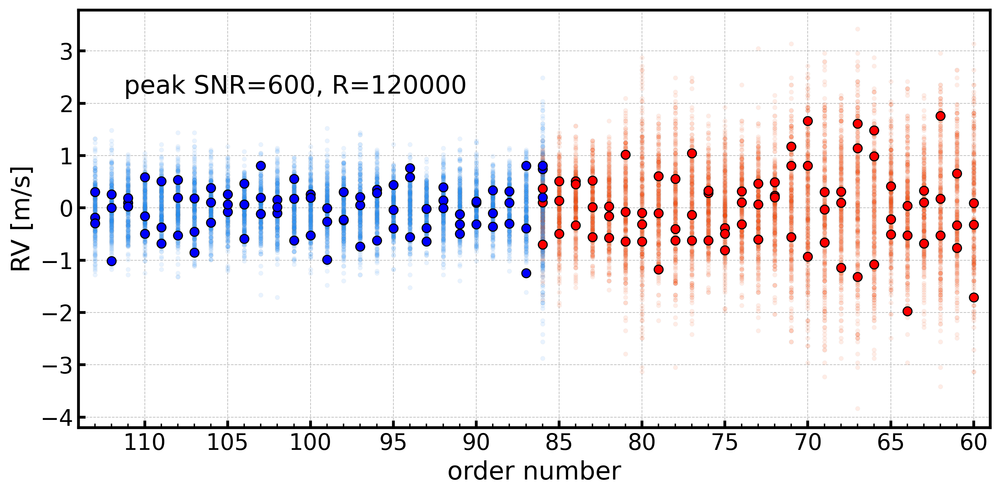

In [9]:
SNR_values = [100, 200, 300, 400, 500, 600, 700, 800, 1200, 2000]
R_values = [10000, 30000, 60000, 90000, 120000, 150000]
nspec = 100

# load and plot SNR=600
snr = 600
R = 120000
rv_all_red = np.zeros((nspec, len(order_num_red), 3))
rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
plt.figure(figsize=(10, 5), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
    filename = f"{R}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_red[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        plt.scatter(order_num['red'], rv[:, 0], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 1], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 2], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
    else:
        plt.scatter(order_num['red'], rv[:, 0], s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 1], s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 2], s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
    filename = f"{R}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_blue[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        plt.scatter(order_num['blue'], rv[:, 0], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        plt.scatter(order_num['blue'], rv[:, 1], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        plt.scatter(order_num['blue'], rv[:, 2], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
    else:
        plt.scatter(order_num['blue'], rv[:, 0], s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 1], s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 2], s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)

# # concatenate the red band into the shape of (nspec*3, len(order)), joining 3 traces for one order
# # calculate the median and std of each order, combining three traces for one order
# # red band
# rv_all_red_transformed = np.hstack(rv_all_red[:, :, :])
# rv_median_red = np.median(rv_all_red_transformed, axis=1)
# rv_std_red = np.std(rv_all_red_transformed, axis=1)
# # plt.errorbar(order_num['red'], rv_median_red, yerr=rv_std_red, fmt='o', color='red', ms=10, elinewidth=2, capsize=3, capthick=2, label='Red band', zorder=5)
# # blue band
# rv_all_blue_transformed = np.hstack(rv_all_blue[:, :, :])
# rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
# rv_std_blue = np.std(rv_all_blue_transformed, axis=1)
# # plt.errorbar(order_num['blue'], rv_median_blue, yerr=rv_std_blue, fmt='o', color='blue', ms=10, elinewidth=2, capsize=3, capthick=2, label='Blue band', zorder=5)

# print(f"SNR={snr}, RV median in the red band: {np.median(rv_median_red)}m/s, std: {np.std(rv_median_red)}m/s")
# print(f"SNR={snr}, RV median in the blue band: {np.median(rv_median_blue)}m/s, std: {np.std(rv_median_blue)}m/s")

# Major and minor x-ticks
order = np.arange(110, 59, -5)  # Major ticks
plt.xticks(order, fontsize=16)
plt.yticks(fontsize=16)
plt.gca().xaxis.set_minor_locator(plt.FixedLocator(np.linspace(60, 113, 27+27)))  # Minor ticks

# Tick formatting
plt.tick_params(axis='x', which='major', direction='in', width=2, length=5)  # Major ticks inside
plt.tick_params(axis='x', which='minor', direction='in', width=1, length=3)  # Minor ticks inside
plt.tick_params(axis='y', which='both', direction='in', width=2, length=5)  # y-ticks inside

# Thicker outer boundary
for spine in plt.gca().spines.values():
    spine.set_linewidth(2)

# Axis limits and inversion
plt.xlim(59, 114)
plt.gca().invert_xaxis()

# Labels and title
plt.xlabel('order number', fontsize=18)
plt.ylabel('RV [m/s]', fontsize=18)

# annotate the SNR and R value
plt.annotate(f"peak SNR={snr}, R={R}", xy=(0.05, 0.8), xycoords='axes fraction', fontsize=18)

# Grid formatting
plt.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/scattered.png'), dpi=300)
plt.show()


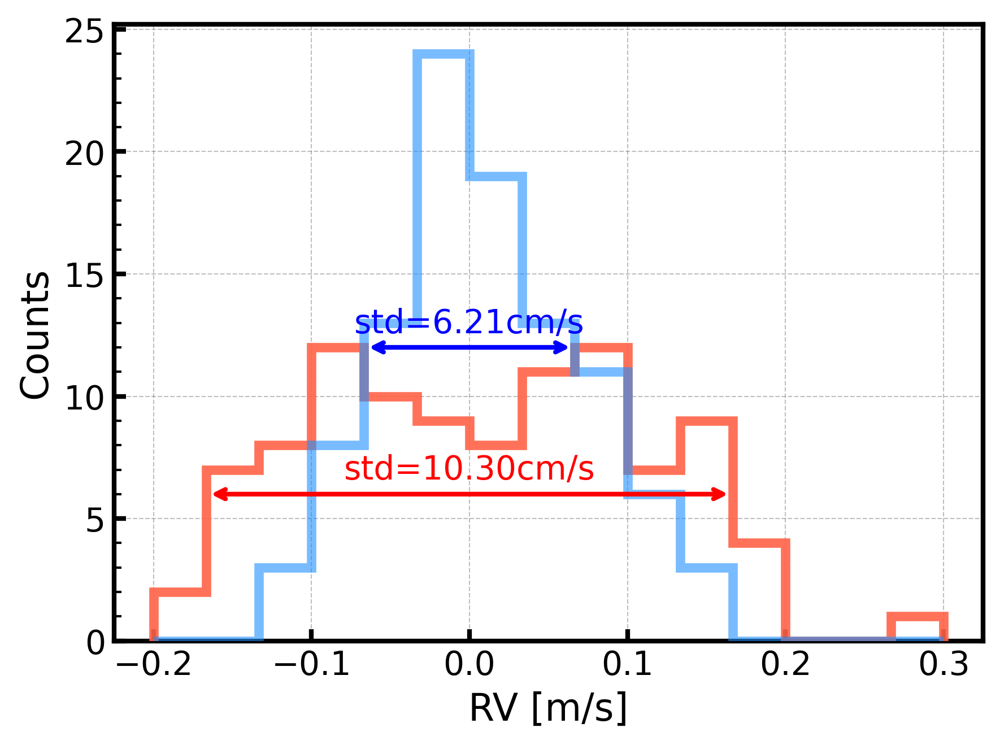

In [8]:
# plot the histogram of RVs at 100 observations
# stack three traces for each order, and the matrix shape should be (nspec, len(order)*3)
rv_red_nspec = np.concatenate(np.stack(rv_all_red, axis=1), axis=1)  # (100, 27*3)
rv_blue_nspec = np.concatenate(np.stack(rv_all_blue, axis=1), axis=1)  # (100, 28*3)
# RVs of each observations
rv_red_nspec_median = np.median(rv_red_nspec, axis=1)
rv_blue_nspec_median = np.median(rv_blue_nspec, axis=1)

# histogram of RVs in the red and blue band in one plot
plt.figure(figsize=(6, 4.5), dpi=300)
bins = np.arange(-0.2, 0.31, 1/30)
hist_red, bin_edges_red = np.histogram(rv_red_nspec_median, bins=bins)
hist_blue, bin_edges_blue = np.histogram(rv_blue_nspec_median, bins=bins)

# Plot histograms
plt.hist(rv_red_nspec_median, bins=bins, histtype='step', align='mid',
         color='red', alpha=0.9, zorder=3,
         edgecolor='tomato', linewidth=4)
plt.hist(rv_blue_nspec_median, bins=bins, histtype='step', align='mid',
         color='blue', alpha=0.6, zorder=3,
         edgecolor='dodgerblue', linewidth=4)

# the x ticks is the bin edges
plt.xticks(fontsize=14)
plt.xlabel('RV [m/s]', fontsize=16)
plt.yticks(np.arange(0, 26, 5), fontsize=14)
plt.gca().yaxis.set_minor_locator(plt.FixedLocator(np.arange(0, 26, 1)))  # Minor ticks
plt.ylabel('Counts', fontsize=16)

# Tick formatting
plt.tick_params(axis='x', which='major', direction='in', width=2, length=5)  # Major ticks inside
plt.tick_params(axis='y', which='major', direction='in', width=2, length=5)  # y-ticks inside
plt.tick_params(axis='y', which='minor', direction='in', width=1, length=3)  # Minor ticks inside

# Thicker outer boundary
for spine in plt.gca().spines.values():
    spine.set_linewidth(2)

# annotate the SNR and R value
# plt.annotate(f"peak SNR={snr}, R={R}", xy=(0.425, 0.8), xycoords='axes fraction', fontsize=15)

# ---------- FWHM start ----------
# Calculate FWHM for red and blue bands
def calculate_fwhm(hist, bin_edges):
    half_max = max(hist) / 2
    indices = np.where(hist >= half_max)[0]
    fwhm_start = bin_edges[indices[0]]
    fwhm_end = bin_edges[indices[-1] + 1]
    return fwhm_start, fwhm_end, half_max

fwhm_red_start, fwhm_red_end, half_max_red = calculate_fwhm(hist_red, bin_edges_red)
fwhm_blue_start, fwhm_blue_end, half_max_blue = calculate_fwhm(hist_blue, bin_edges_blue)

# Add double-headed arrows for FWHM
plt.annotate('', xy=(fwhm_red_start, half_max_red), xytext=(fwhm_red_end, half_max_red),
                arrowprops=dict(arrowstyle='<->', color='red', lw=2), zorder=10)
plt.annotate(f"std={np.std(rv_red_nspec_median*100):.2f}cm/s", xy=((fwhm_red_start + fwhm_red_end) / 2, half_max_red + 0.6),
                ha='center', color='red', fontsize=14, zorder=10)

plt.annotate('', xy=(fwhm_blue_start, half_max_blue), xytext=(fwhm_blue_end, half_max_blue),
                arrowprops=dict(arrowstyle='<->', color='blue', lw=2), zorder=10)
plt.annotate(f"std={np.std(rv_blue_nspec_median*100):.2f}cm/s", xy=((fwhm_blue_start + fwhm_blue_end) / 2, half_max_blue + 0.6),
                ha='center', color='blue', fontsize=14, zorder=10)
# ---------- FWHM end ----------

plt.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=1)
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/histogram.png'), dpi=300)
plt.show()

### 1.2 RV precision v.s. resolution

This cell might take several minutes to run, but you can save it into a npz file as I show below.

In [ ]:
# extract RV precision information
def rv_precision(snr_values, R):

    pre_red = np.zeros_like(snr_values, dtype=float)
    pre_blue = np.zeros_like(snr_values, dtype=float)

    for i, snr in enumerate(snr_values):
        rv_all_red = np.zeros((nspec, len(order_num_red), 3))
        rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
            filename = f"{R}_{ispec}_red.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_red[ispec, :, :] = rv
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")
            filename = f"{R}_{ispec}_blue.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_blue[ispec, :, :] = rv
        # red
        rv_all_red_transformed = np.hstack([rv_all_red[:, :, j] for j in range(3)])  # with shape (nspec, len(order)*3)
        rv_median_red = np.median(rv_all_red_transformed, axis=1)  # with shape (nspec,)
        # blue
        rv_all_blue_transformed = np.hstack([rv_all_blue[:, :, j] for j in range(3)])
        rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
        # precision
        # std
        pre_red[i] = np.std(rv_median_red)
        pre_blue[i] = np.std(rv_median_blue)
        # MAD
        # pre_red[i] = mad(rv_median_red)
        # pre_blue[i] = mad(rv_median_blue)

    return pre_red, pre_blue

pre_red_1, pre_blue_1 = rv_precision(SNR_values, 10000)
pre_red_3, pre_blue_3 = rv_precision(SNR_values, 30000)
pre_red_6, pre_blue_6 = rv_precision(SNR_values, 60000)
pre_red_9, pre_blue_9 = rv_precision(SNR_values, 90000)
pre_red_12, pre_blue_12 = rv_precision(SNR_values, 120000)
pre_red_15, pre_blue_15 = rv_precision(SNR_values, 150000)

In [ ]:
# create a matrix to store the RV precision for different R and SNR
pre_red = np.concatenate([pre_red_1[:, np.newaxis], pre_red_3[:, np.newaxis], pre_red_6[:, np.newaxis], pre_red_9[:, np.newaxis], pre_red_12[:, np.newaxis], pre_red_15[:, np.newaxis]], axis=1)
pre_blue = np.concatenate([pre_blue_1[:, np.newaxis], pre_blue_3[:, np.newaxis], pre_blue_6[:, np.newaxis], pre_blue_9[:, np.newaxis], pre_blue_12[:, np.newaxis], pre_blue_15[:, np.newaxis]], axis=1)

np.savez('rv_precision_matrix.npz', SNR_values=SNR_values, R_values=R_values, pre_red=pre_red, pre_blue=pre_blue)

In [10]:
data = np.load('rv_precision_matrix.npz')
pre_red, pre_blue = data['pre_red'], data['pre_blue']
pre_red.shape

(10, 6)

A relation between RV precision and SNR according to Bottom et al. 2013:
$$\sigma_\mathrm{RV} \propto R^{-1.2}$$

/tmp/ipykernel_2938761/3864663016.py:7: RuntimeWarning: invalid value encountered in power
  return (a * np.array(R) + b)**(-1.2)


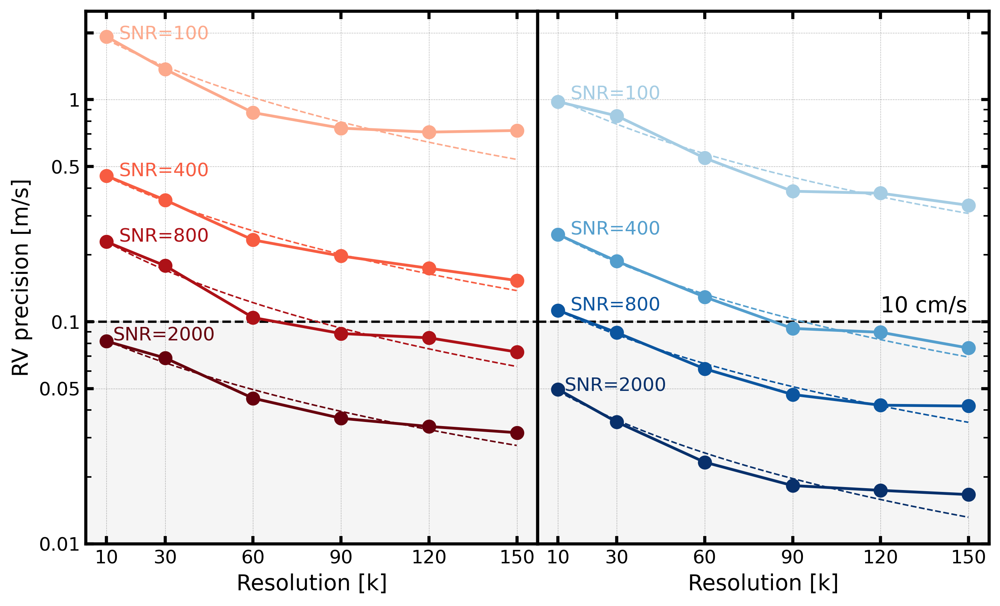

In [11]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.optimize import curve_fit
import numpy as np

def Bottom13(R, a, b):
    return (a * np.array(R) + b)**(-1.2)

rms_red = np.zeros(len(SNR_values))
rms_blue = np.zeros(len(SNR_values))

# Plot setup with shared y-axis and no space between subplots
fig, axes = plt.subplots(1, 2, figsize=(9, 5.5), dpi=300, sharey=True, gridspec_kw={'wspace': 0, 'hspace': 0})

for i, isnr in enumerate(SNR_values):
    color_red = plt.cm.Reds((i + 4) / (len(SNR_values)+3))
    color_blue = plt.cm.Blues((i + 5) / (len(SNR_values)+4))

    # Left subplot: Red band
    ax = axes[0]
    popt_red, _ = curve_fit(Bottom13, R_values, pre_red[i, :], maxfev=2000)
    if isnr in [400, 100, 800, 2000]:
        ax.plot(R_values, pre_red[i, :], 'o-', label=f'SNR={isnr}', color=color_red, linewidth=1.8, ms=8)
        ax.plot(np.arange(1e4, 15e4, 100), Bottom13(np.arange(1e4, 15e4, 100), *popt_red), linestyle='--', linewidth=1, color=color_red)
        ax.annotate(f"SNR={isnr}", (R_values[0] + 17000, Bottom13(1e4, *popt_red)), textcoords="offset points", xytext=(5, 0), ha='center', color=color_red, fontsize=12)
    rms_red[i] = np.sqrt(np.sum(((pre_red[i, :] - Bottom13(R_values, *popt_red))**2) / len(R_values)))

    # Right subplot: Blue band
    ax = axes[1]
    popt_blue, _ = curve_fit(Bottom13, R_values, pre_blue[i, :], maxfev=2000)
    if isnr in [400, 100, 800, 2000]:
        ax.plot(R_values, pre_blue[i, :], 'o-', label=f'SNR={isnr}', color=color_blue, linewidth=1.8, ms=8)
        ax.plot(np.arange(1e4, 15e4, 100), Bottom13(np.arange(1e4, 15e4, 100), *popt_blue), linestyle='--', linewidth=1, color=color_blue)
        ax.annotate(f"SNR={isnr}", (R_values[0] + 17000, Bottom13(1e4, *popt_blue)), textcoords="offset points", xytext=(5, 0), ha='center', color=color_blue, fontsize=12)
    rms_blue[i] = np.sqrt(np.sum(((pre_blue[i, :] - Bottom13(R_values, *popt_blue))**2) / len(R_values)))

# fill the < 0.1m/s area
for ax in axes:
    ax.axhspan(0.01, 0.1, color='whitesmoke', zorder=0)
    ax.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
axes[1].annotate('10 cm/s', xy=(12e4, 0.11), fontsize=14, color='k', zorder=10)

# Formatting for both subplots
for ax in axes:
    ax.set_yscale('log')
    ax.set_yticks([0.01, 0.05, 0.1, 0.5, 1, 2])
    ax.set_yticklabels([0.01, 0.05, 0.1, 0.5, 1, ''], fontsize=12)
    ax.set_ylim(0.01, 2.5)
    ax.set_xticks(R_values)
    ax.set_xticklabels([f"{x/1000:.0f}" for x in R_values], fontsize=12)
    ax.tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
    ax.tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
    ax.grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

# Left plot adjustments
axes[0].set_xlabel('Resolution [k]', fontsize=14)
axes[0].set_ylabel('RV precision [m/s]', fontsize=14)

# Right plot adjustments
axes[1].tick_params(left=False, labelleft=False)  # Remove left y-axis labels and ticks

# Move right y-ticks to the right side without labels
axes[1].yaxis.tick_right()
axes[1].tick_params(axis='y', which='both', labelright=False)  # Keep ticks but hide labels
axes[1].set_xlabel('Resolution [k]', fontsize=14)

# Add ticks on the top for both subplots (hide labels)
for ax in axes:
    ax.tick_params(axis='x', which='both', top=True, labeltop=False)

# Thicker outer boundary for each subplot
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/std_resolution.png'), dpi=300)
plt.show()


### 1.3 RV precision v.s. SNR

In [12]:
mean_SNR_red = np.zeros(len(SNR_values))
mean_SNR_blue = np.zeros(len(SNR_values))

# the real SNR
for i, isnr in enumerate(SNR_values):
# for i, isnr in enumerate([2000]):
    # red
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{isnr}")
    filename = f"{R}_0_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    flux = data['flux']
    order_SNR = np.sqrt(flux)
    # print(np.shape(order_SNR))
    median_SNR = np.mean(np.median(np.median(order_SNR, axis=2), axis=1))
    mean_SNR_red[i] = median_SNR
    # print(f"red: peak SNR at {isnr}, median SNR around {median_SNR:.0f}")
    # blue
    output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{isnr}")
    filename = f"{R}_0_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    flux = data['flux']
    order_SNR = np.sqrt(flux)
    median_SNR = np.mean(np.median(np.median(order_SNR, axis=2), axis=1))
    mean_SNR_blue[i] = median_SNR
    # print(f"blue: peak SNR at {isnr}, median SNR around {median_SNR:.0f}")

print(mean_SNR_red[0:8])
print(mean_SNR_blue[0:8])

[ 84.48641242 168.99852236 253.50365067 337.99451776 422.50062394
 507.01328878 591.50034002 675.9999384 ]
[ 60.38590027 120.78287084 181.17178065 241.56830747 301.99330312
 362.37755634 422.75106958 483.16868639]


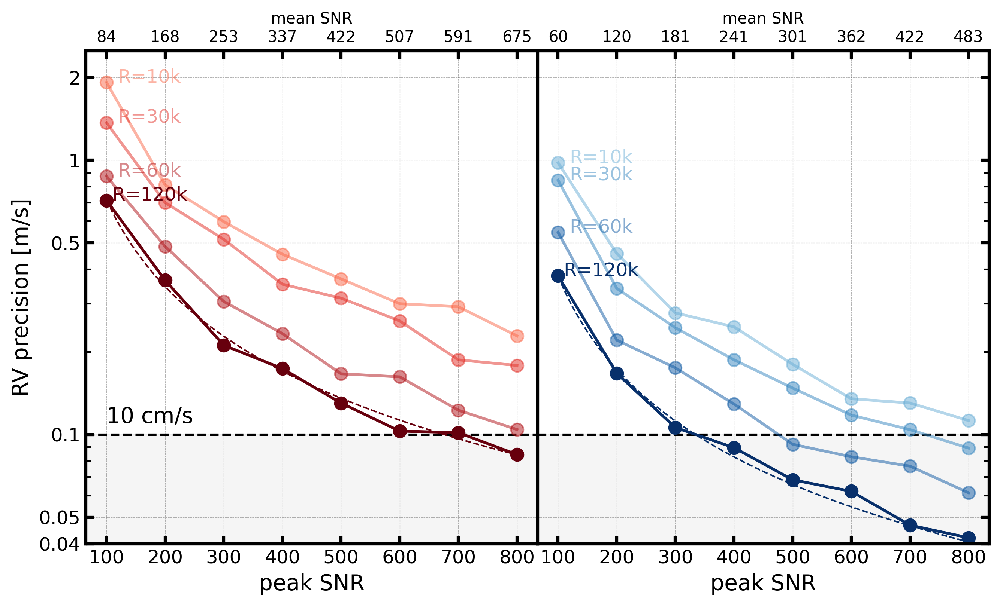

In [32]:
# empirical relation between SNR and RV precision
def empirical(snr, a, b):
    return 1 / (a * np.array(snr) + b)

# Plot setup with shared y-axis and no space between subplots
fig, axes = plt.subplots(1, 2, figsize=(9, 5.5), dpi=300, sharey=True, gridspec_kw={'wspace': 0, 'hspace': 0})

for i, iR in enumerate(R_values):
    color_red = plt.cm.Reds((i + 3) / (len(R_values)))
    color_blue = plt.cm.Blues((i + 3) / (len(R_values)))

    # Left subplot: Red band
    ax = axes[0]
    popt_red, _ = curve_fit(empirical, SNR_values, pre_red[:, i], maxfev=2000)
    if iR in [10000, 30000, 60000, 120000]:
        if iR != 120000:
            ax.plot(np.arange(100, 801, 100), pre_red[0:8, i], 'o-', label=f'R={iR}', color=color_red, linewidth=1.8, ms=8, alpha=0.5)
            # ax.plot(np.arange(100, 801, 50), empirical(np.arange(100, 801, 50), *popt_red), linestyle='--', linewidth=1, color=color_red, alpha=0.5)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_red[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_red, fontsize=12, alpha=0.5)
        else:
            ax.plot(np.arange(100, 801, 100), pre_red[0:8, i], 'o-', label=f'R={iR}', color=color_red, linewidth=1.8, ms=8)
            ax.plot(np.arange(100, 801, 10), empirical(np.arange(100, 801, 10), *popt_red), linestyle='--', linewidth=1, color=color_red)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_red[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_red, fontsize=12)

    # Right subplot: Blue band
    ax = axes[1]
    popt_blue, _ = curve_fit(empirical, SNR_values, pre_blue[:, i], maxfev=2000)
    if iR in [10000, 30000, 60000, 120000]:
        if iR != 120000:
            ax.plot(np.arange(100, 801, 100), pre_blue[0:8, i], 'o-', label=f'R={iR}', color=color_blue, linewidth=1.8, ms=8, alpha=0.5)
            # ax.plot(np.arange(100, 801, 10), empirical(np.arange(100, 801, 10), *popt_blue), linestyle='--', linewidth=1, color=color_blue, alpha=0.5)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_blue[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_blue, fontsize=12, alpha=0.5)
        else:
            ax.plot(np.arange(100, 801, 100), pre_blue[0:8, i], 'o-', label=f'R={iR}', color=color_blue, linewidth=1.8, ms=8)
            ax.plot(np.arange(100, 801, 10), empirical(np.arange(100, 801, 10), *popt_blue), linestyle='--', linewidth=1, color=color_blue)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_blue[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_blue, fontsize=12)

# fill the < 0.1m/s area
for ax in axes:
    ax.axhspan(0.01, 0.1, color='whitesmoke', zorder=0)
    ax.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
axes[0].annotate('10 cm/s', xy=(100, 0.11), fontsize=14, color='k', zorder=10)

# Formatting for both subplots
for ax in axes:
    ax.set_yscale('log')
    ax.set_yticks([0.04, 0.05, 0.1, 0.5, 1, 2])
    ax.set_yticklabels([0.04, 0.05, 0.1, 0.5, 1, 2], fontsize=12)
    ax.set_ylim(0.04, 2.5)
    ax.set_xticks(np.arange(100, 801, 100))
    ax.set_xticklabels([f"{x:.0f}" for x in np.arange(100, 801, 100)], fontsize=12)
    ax.tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
    ax.tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
    ax.grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

# Left plot adjustments
axes[0].set_xlabel('peak SNR', fontsize=14)
axes[0].set_ylabel('RV precision [m/s]', fontsize=14)

# Right plot adjustments
axes[1].tick_params(left=False, labelleft=False)  # Remove left y-axis labels and ticks

# Move right y-ticks to the right side without labels
axes[1].yaxis.tick_right()
axes[1].tick_params(axis='y', which='both', labelright=False)  # Keep ticks but hide labels
axes[1].set_xlabel('peak SNR', fontsize=14)

# Left subplot
ax_top_left = axes[0].twiny()
ax_top_left.set_xticks(np.arange(100, 801, 100))
ax_top_left.set_xticklabels([int(i) for i in mean_SNR_red[0:8]], fontsize=10)
ax_top_left.tick_params(
                        axis='x', 
                        which='major', 
                        direction='in', 
                        length=5,  # Match the bottom ticks
                        width=2    # Match the bottom ticks
                    )
ax_top_left.set_xlim(axes[0].get_xlim())
ax_top_left.set_xlabel('mean SNR', fontsize=10)

# Right subplot
ax_top_right = axes[1].twiny()
ax_top_right.set_xticks(np.arange(100, 801, 100))
ax_top_right.set_xticklabels([int(i) for i in mean_SNR_blue[0:8]], fontsize=10)
ax_top_right.tick_params(
                        axis='x', 
                        which='major', 
                        direction='in', 
                        length=5,  # Match the bottom ticks
                        width=2    # Match the bottom ticks
                    )
ax_top_right.set_xlim(axes[1].get_xlim())
ax_top_right.set_xlabel('mean SNR', fontsize=10)


# Thicker outer boundary for each subplot
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/std_SNR.png'), dpi=300)
plt.show()


### 1.4 Spectra at different resolutions

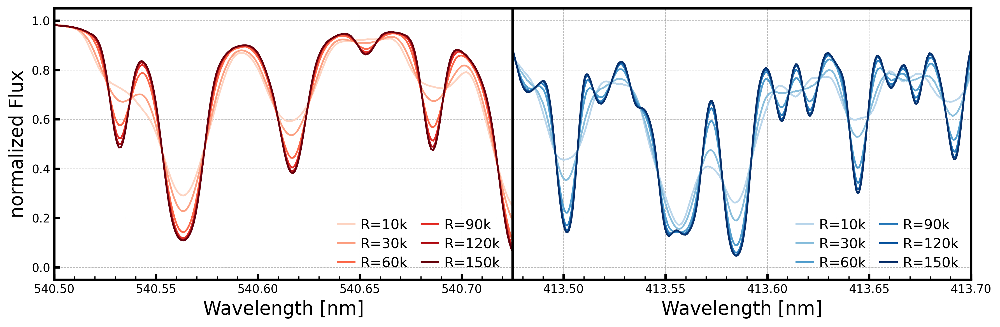

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Create the figure and gridspec
fig = plt.figure(figsize=(12, 4), dpi=300)  # Adjust the overall figure size
gs = fig.add_gridspec(1, 2, width_ratios=[1, 1], wspace=0)  # Remove space between subplots

# Left plot (red spectrum)
ax1 = fig.add_subplot(gs[0], sharey=None)  # Left plot
snr = 2000
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")

for i, iR in enumerate(R_values):
    filename = f"{iR}_{ispec}_{band}.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    color_red = plt.cm.Reds((i + 1) / len(R_values))

    wave_lim = [540.5, 540.7]
    flux = data['flux'][-1, 0, :]
    blaze = data['blaze'][-1, 0, :]
    throughput = data['throughput'][-1, 0, :]
    normalized_flux = flux / (blaze * throughput * snr**2)
    ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
    wave_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
    wave_lim = [data['wavelength'][-1, 0, :][wave_ind[0]], data['wavelength'][-1, 0, :][wave_ind[1]]]
    ax1.plot(data['wavelength'][-1, 0, :], normalized_flux, linewidth=1.5, color=color_red, label=f"R={iR/1000:.0f}k")

ax1.set_xlim(540.5, 540.725)
ax1.set_ylim(-0.05, 1.05)
ax1.set_xticks(np.arange(540.5, 540.71, 0.05))
ax1.set_xlabel('Wavelength [nm]', fontsize=16)
ax1.set_ylabel('normalized Flux', fontsize=16)
ax1.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax1.tick_params(axis='y', which='major', direction='in', width=2, length=5)

# Add minor x-ticks for the left plot
ax1.xaxis.set_minor_locator(plt.FixedLocator(np.arange(540.5, 540.75, 0.01)))
ax1.tick_params(axis='x', which='minor', direction='in', width=1, length=3)

ax1.legend(fontsize=12, frameon=False, loc='lower right', ncol=2, bbox_to_anchor=(1, -0.01),
           labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)
ax1.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=1)

# Thicker outer boundary for ax1
for spine in ax1.spines.values():
    spine.set_linewidth(2)

# Right plot (blue spectrum)
ax2 = fig.add_subplot(gs[1], sharey=ax1)  # Share the y-axis with ax1
band = 'blue'
output_folder = os.path.join(pwd, f"output/synfile_nocont/snr{snr}")

for i, iR in enumerate(R_values):
    filename = f"{iR}_{ispec}_{band}.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    color_blue = plt.cm.Blues((i + 2) / (len(R_values) + 1))

    wave_lim = [413.5, 413.7]
    flux = data['flux'][-1, 0, :]
    blaze = data['blaze'][-1, 0, :]
    throughput = data['throughput'][-1, 0, :]
    normalized_flux = flux / (blaze * throughput * snr**2)
    ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
    wave_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
    wave_lim = [data['wavelength'][-1, 0, :][wave_ind[0]], data['wavelength'][-1, 0, :][wave_ind[1]]]
    ax2.plot(data['wavelength'][-1, 0, :], normalized_flux, linewidth=1.5, color=color_blue, label=f"R={iR/1000:.0f}k")

ax2.set_xlim(413.475, 413.7)
ax2.set_xticks(np.arange(413.5, 413.71, 0.05))
ax2.set_xlabel('Wavelength [nm]', fontsize=16)
ax2.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax2.tick_params(axis='y', left=False, labelleft=False)  # Hide y-axis ticks and labels

# Add minor x-ticks for the right plot
ax2.xaxis.set_minor_locator(plt.FixedLocator(np.arange(413.45, 413.71, 0.01)))
ax2.tick_params(axis='x', which='minor', direction='in', width=1, length=3)

ax2.legend(fontsize=12, frameon=False, loc='lower right', ncol=2, bbox_to_anchor=(1, -0.01),
           labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)
ax2.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=1)

# Thicker outer boundary for ax2
for spine in ax2.spines.values():
    spine.set_linewidth(2)

# Adjust layout and show the plot
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/spectrum_resolution.png'), dpi=300)
plt.show()


## 2. Only cal-sci contamination.

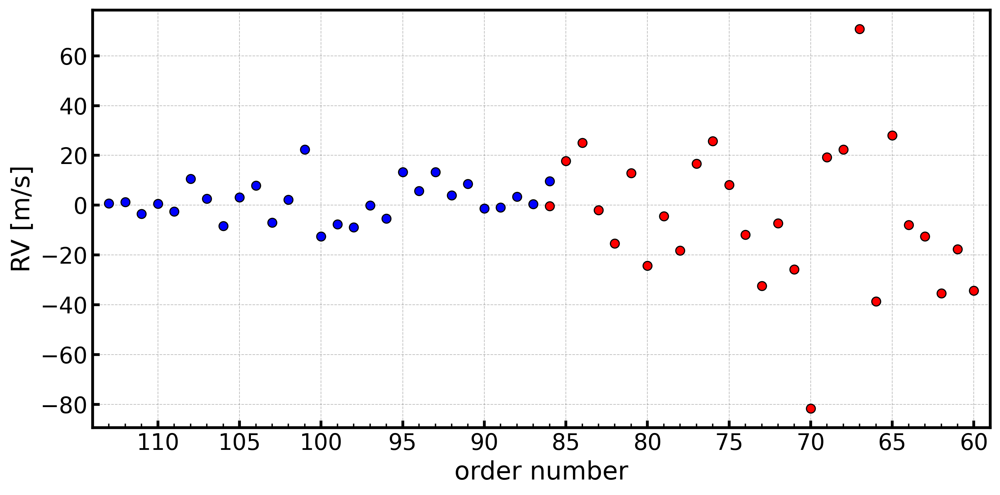

In [7]:
SNR_values = [100, 800]
calsci_frac_values = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
nspec = 1

# load and plot SNR=100
snr = 100
calsci_frac = 1e-1
plt.figure(figsize=(10, 5), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
    filename = f"{calsci_frac}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    plt.scatter(order_num['red'], rv[:, 0], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
    # plt.scatter(order_num['red'], rv[:, 1], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
    # plt.scatter(order_num['red'], rv[:, 2], s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
    filename = f"{calsci_frac}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    plt.scatter(order_num['blue'], rv[:, 0], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
    # plt.scatter(order_num['blue'], rv[:, 1], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
    # plt.scatter(order_num['blue'], rv[:, 2], s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)

# Major and minor x-ticks
order = np.arange(110, 59, -5)  # Major ticks
plt.xticks(order, fontsize=16)
plt.yticks(fontsize=16)
plt.gca().xaxis.set_minor_locator(plt.FixedLocator(np.linspace(60, 113, 27+27)))  # Minor ticks

# Tick formatting
plt.tick_params(axis='x', which='major', direction='in', width=2, length=5)  # Major ticks inside
plt.tick_params(axis='x', which='minor', direction='in', width=1, length=3)  # Minor ticks inside
plt.tick_params(axis='y', which='both', direction='in', width=2, length=5)  # y-ticks inside

# Thicker outer boundary
for spine in plt.gca().spines.values():
    spine.set_linewidth(2)

# Axis limits and inversion
plt.xlim(59, 114)
plt.gca().invert_xaxis()

# Labels and title
plt.xlabel('order number', fontsize=18)
plt.ylabel('RV [m/s]', fontsize=18)

# annotate the SNR and R value
# plt.annotate(f"peak SNR={snr}, contamination fraction={calsci_frac*100:.0f}%", xy=(0.05, 0.8), xycoords='axes fraction', fontsize=18)

# Grid formatting
plt.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/scattered_calsci.png'), dpi=300)
plt.show()


In [10]:
ispec = 0

# extract RV precision information for contaminated trace 1
def rv_precision_calsci(calsci_frac_values):

    pre_red = np.zeros_like(calsci_frac_values, dtype=float)
    pre_blue = np.zeros_like(calsci_frac_values, dtype=float)

    rv_trace1_red = np.zeros((len(calsci_frac_values), len(order_num_red)))
    rv_trace1_blue = np.zeros((len(calsci_frac_values), len(order_num_blue)))

    for i, calsci_frac in enumerate(calsci_frac_values):
        # red
        output_folder_red = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename_red = f"{calsci_frac}_{ispec}_red.npz"
        filepath_red = os.path.join(output_folder_red, filename_red)
        data_red = np.load(filepath_red)
        rv_red = data_red['RV']
        rv_trace1_red[i, :] = rv_red[:, 0]
        # blue
        output_folder_blue = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
        filename_blue = f"{calsci_frac}_{ispec}_blue.npz"
        filepath_blue = os.path.join(output_folder_blue, filename_blue)
        data_blue = np.load(filepath_blue)
        rv_blue = data_blue['RV']
        rv_trace1_blue[i, :] = rv_blue[:, 0]

    # red
    rv_median_red = np.median(rv_trace1_red, axis=1)
    rv_std_red = np.std(rv_trace1_red, axis=1)
    # blue
    rv_median_blue = np.median(rv_trace1_blue, axis=1)
    rv_std_blue = np.std(rv_trace1_blue, axis=1)

    return rv_median_red, rv_std_red, rv_median_blue, rv_std_blue

rv_median_red, rv_std_red, rv_median_blue, rv_std_blue = rv_precision_calsci(calsci_frac_values)

/tmp/ipykernel_485056/2607932519.py:16: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.annotate('',


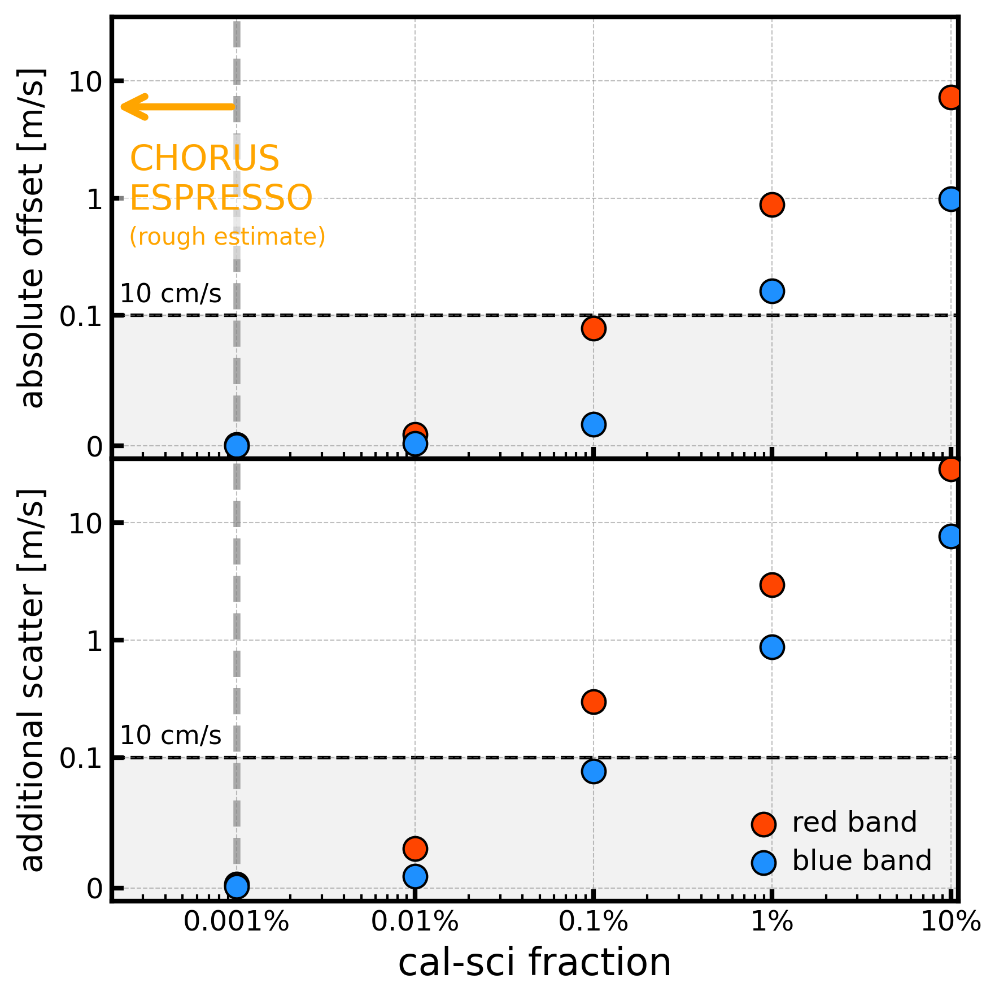

In [23]:
# Create the figure and subplots with no vertical spacing
fig, axs = plt.subplots(2, 1, figsize=(6, 6), dpi=300, sharex=True, gridspec_kw={'hspace': 0})

# ---------- Upper Plot ----------
ax = axs[0]
for i in range(len(calsci_frac_values)):
    red = ax.scatter(calsci_frac_values[i], abs(rv_median_red[i]), marker='o',
                     color='orangered', edgecolors='black', linewidths=1, s=100, zorder=5)
    blue = ax.scatter(calsci_frac_values[i], abs(rv_median_blue[i]), marker='o',
                      color='dodgerblue', edgecolors='black', linewidths=1, s=100, zorder=5)

# ax.axvspan(0.55e-6, 1e-5, color='lemonchiffon', zorder=1)
ax.axvline(x=1e-5, color='darkgrey', linestyle='--', linewidth=3, zorder=1)
ax.text(0.25e-5, 0.8, 'CHORUS\nESPRESSO', fontsize=15, color='orange', bbox=dict(facecolor='white', edgecolor='none', alpha=0.5), zorder=10)
ax.text(0.25e-5, 0.4, '(rough estimate)', fontsize=10, color='orange', bbox=dict(facecolor='white', edgecolor='none', alpha=0.5), zorder=10)
ax.annotate('', 
            fontsize=22,
            xy=(0.2e-5, 6),        
            xytext=(1e-5, 6),      
            arrowprops=dict(facecolor='orange', color='orange', arrowstyle='->', lw=3),
            color='orange', zorder=20)

ax.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax.text(0.22e-5, 0.13, '10 cm/s', fontsize=11, color='k', zorder=10)
ax.axhspan(-0.1, 0.1, color='gray', alpha=0.1, zorder=0)

ax.set_xscale('log')
ax.set_yscale('symlog', linthresh=0.1)
x_ticks = ['0.001%', '0.01%', '0.1%', '1%', '10%']
ax.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
ax.set_xticklabels([str(tick) for tick in x_ticks], fontsize=12)
y_ticks = [-10, -1, -0.1, 0, 0.1, 1, 10]
ax.set_yticks(y_ticks)
ax.set_yticklabels([str(tick) for tick in y_ticks], fontsize=12)

ax.set_xlim(0.2e-5, 1.1e-1)
ax.set_ylim(-0.01, 35.01)
ax.set_ylabel('absolute offset [m/s]', fontsize=14)

ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)

ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

for spine in ax.spines.values():
    spine.set_linewidth(2)

# ---------- Lower Plot ----------
ax = axs[1]
for i in range(len(calsci_frac_values)):
    red = ax.scatter(calsci_frac_values[i], rv_std_red[i], marker='o',
                     color='orangered', edgecolors='black', linewidths=1, s=100, zorder=5)
    blue = ax.scatter(calsci_frac_values[i], rv_std_blue[i], marker='o',
                      color='dodgerblue', edgecolors='black', linewidths=1, s=100, zorder=5)

# ax.axvspan(0.55e-6, 1e-5, color='lemonchiffon', zorder=1)
ax.axvline(x=1e-5, color='darkgrey', linestyle='--', linewidth=3, zorder=1)
# ax.text(0.25e-5, 4, 'CHORUS\nESPRESSO', fontsize=15, color='orange', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8), zorder=10)
# ax.text(0.25e-5, 2, '(rough estimate)', fontsize=10, color='orange', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8), zorder=10)
# ax.annotate('', 
#             fontsize=22,
#             xy=(0.2e-5, 22),        
#             xytext=(1e-5, 22),      
#             arrowprops=dict(facecolor='orange', color='orange', arrowstyle='->', lw=3),
#             color='orange', zorder=20)

ax.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax.text(0.22e-5, 0.13, '10 cm/s', fontsize=11, color='k', zorder=10)
ax.axhspan(-0.1, 0.1, color='gray', alpha=0.1, zorder=0)

ax.set_xscale('log')
ax.set_yscale('symlog', linthresh=0.1)
x_ticks = ['0.001%', '0.01%', '0.1%', '1%', '10%']
ax.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
ax.set_xticklabels([str(tick) for tick in x_ticks], fontsize=12)
y_ticks = [0, 0.1, 1, 10]
ax.set_yticks(y_ticks)
ax.set_yticklabels([str(tick) for tick in y_ticks], fontsize=12)

ax.set_xlim(0.2e-5, 1.1e-1)
ax.set_ylim(-0.01, 35.01)
ax.set_xlabel('cal-sci fraction', fontsize=16)
ax.set_ylabel('additional scatter [m/s]', fontsize=14)

ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)

ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

for spine in ax.spines.values():
    spine.set_linewidth(2)

# Add a legend to the lower plot
ax.legend([red, blue], ['red band', 'blue band'], loc='lower right', fontsize=12, frameon=False,
          ncol=1, bbox_to_anchor=(1, 0), labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary for the entire figure
# fig.patch.set_linewidth(2)
# fig.patch.set_edgecolor('black')

plt.tight_layout()


plt.savefig(os.path.join(pwd, 'output/paper_plots/results_calsci.png'), dpi=600)
plt.show()


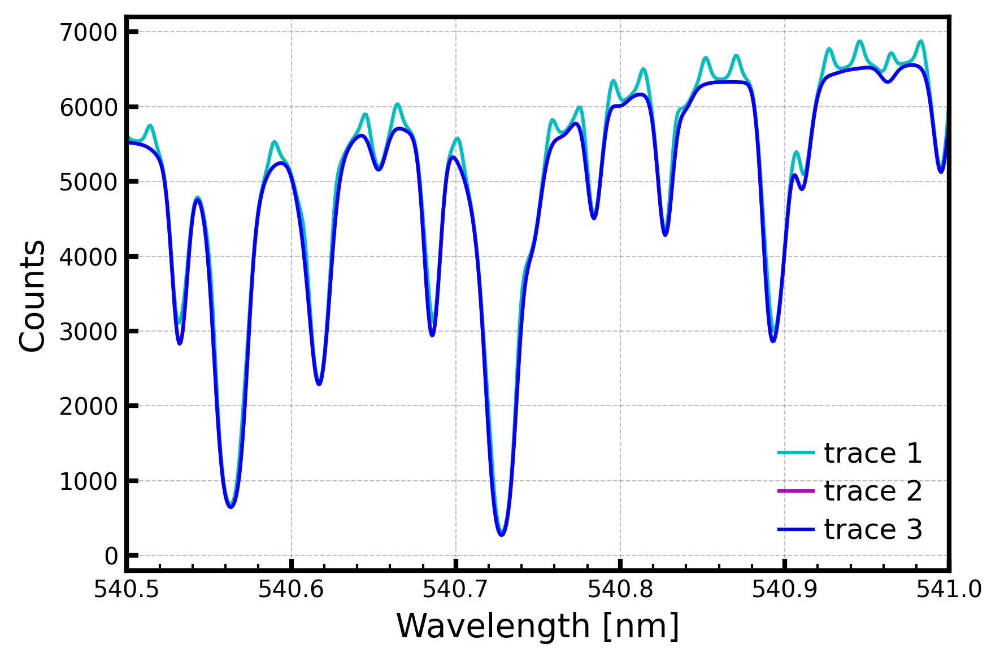

In [58]:
# Load the data
snr = 100
scisci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [540.5, 541]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

# Create the figure
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)

# Plot the data
ax.plot(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], linewidth=1.5, color='c', label='trace 1')
ax.plot(data['wavelength'][-1, 1, :], data['flux'][-1, 1, :], linewidth=1.5, color='m', label='trace 2')
ax.plot(data['wavelength'][-1, 2, :], data['flux'][-1, 2, :], linewidth=1.5, color='b', label='trace 3')

# Set x and y limits
ax.set_xlim(wave_lim[0], wave_lim[1])
ax.set_ylim(-200, 7200)

# Set axis labels
ax.set_xlabel('Wavelength [nm]', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(wave_lim[0], wave_lim[1], 0.02)))

# Add grid
ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=14)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

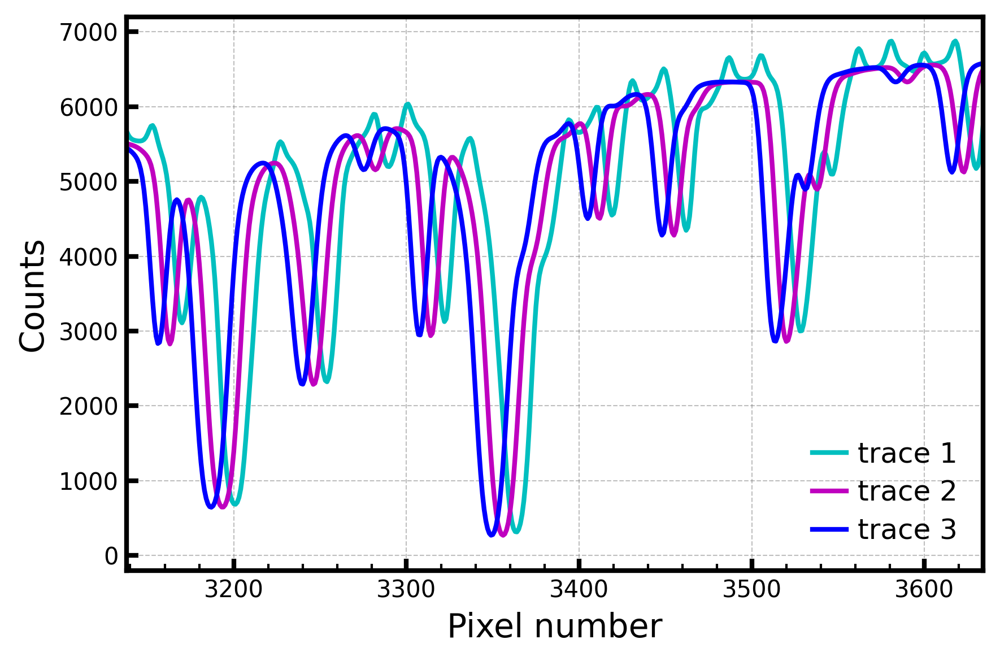

In [55]:
# Load the data
snr = 100
scisci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [540.5, 541]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

# Create the figure
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)

# Plot the data
ax.plot(range(1, 8001), data['flux'][-1, 0, :], linewidth=2, color='c', label='trace 1')
ax.plot(range(1, 8001), data['flux'][-1, 1, :], linewidth=2, color='m', label='trace 2')
ax.plot(range(1, 8001), data['flux'][-1, 2, :], linewidth=2, color='b', label='trace 3')

# Set x and y limits
ax.set_xlim(pix_ind[0], pix_ind[1])
ax.set_ylim(-200, 7200)

# Set axis labels
ax.set_xlabel('Pixel number', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(3100, 3700, 20)))

# Add grid
ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=14)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


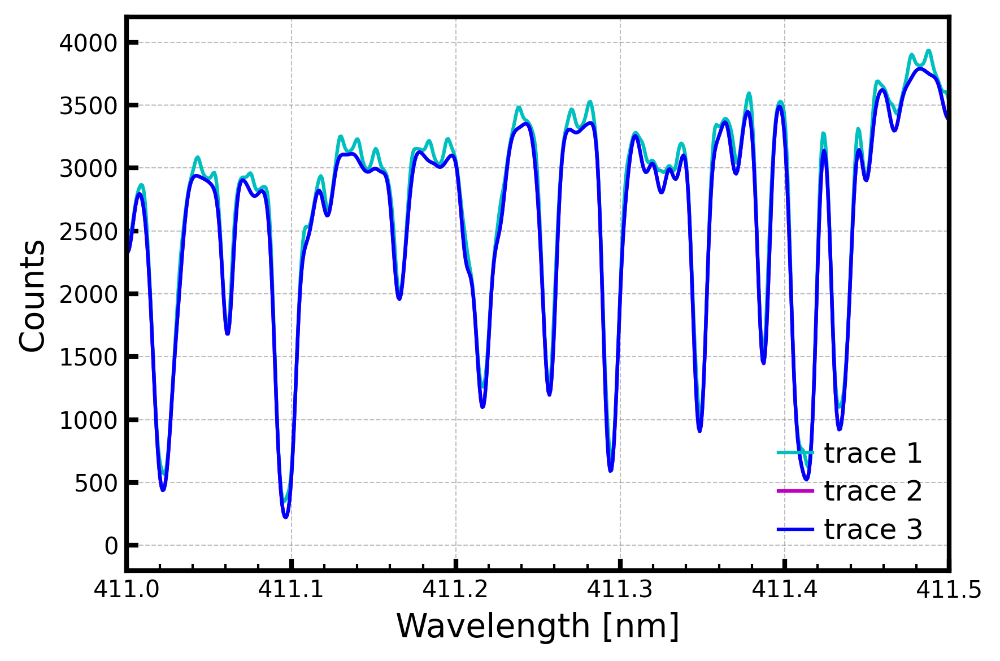

In [59]:
# Load the data
snr = 100
scisci_frac = 1e-1
band = 'blue'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [411, 411.5]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

# Create the figure
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)

# Plot the data
ax.plot(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], linewidth=1.5, color='c', label='trace 1')
ax.plot(data['wavelength'][-1, 1, :], data['flux'][-1, 1, :], linewidth=1.5, color='m', label='trace 2')
ax.plot(data['wavelength'][-1, 2, :], data['flux'][-1, 2, :], linewidth=1.5, color='b', label='trace 3')

# Set x and y limits
ax.set_xlim(wave_lim[0], wave_lim[1])
ax.set_ylim(-200, 4200)

# Set axis labels
ax.set_xlabel('Wavelength [nm]', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(wave_lim[0], wave_lim[1], 0.02)))

# Add grid
ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=14)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

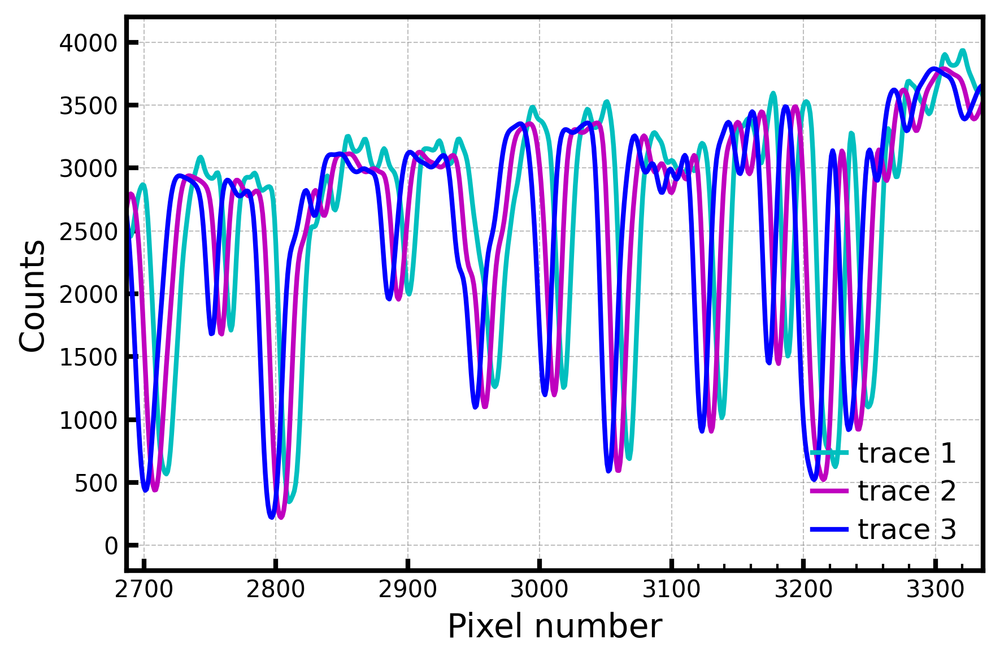

In [61]:
# Load the data
snr = 100
scisci_frac = 1e-1
band = 'blue'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [411, 411.5]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

# Create the figure
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)

# Plot the data
ax.plot(range(1, 8001), data['flux'][-1, 0, :], linewidth=2, color='c', label='trace 1')
ax.plot(range(1, 8001), data['flux'][-1, 1, :], linewidth=2, color='m', label='trace 2')
ax.plot(range(1, 8001), data['flux'][-1, 2, :], linewidth=2, color='b', label='trace 3')

# Set x and y limits
ax.set_xlim(pix_ind[0], pix_ind[1])
ax.set_ylim(-200, 4200)

# Set axis labels
ax.set_xlabel('Pixel number', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(3100, 3700, 20)))

# Add grid
ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# plt.title(f"Flux for SNR={snr} in the {band} band, cal-sci contamination fraction {calsci_frac}", fontsize=14)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


## 3. Only sci-sci contamination.

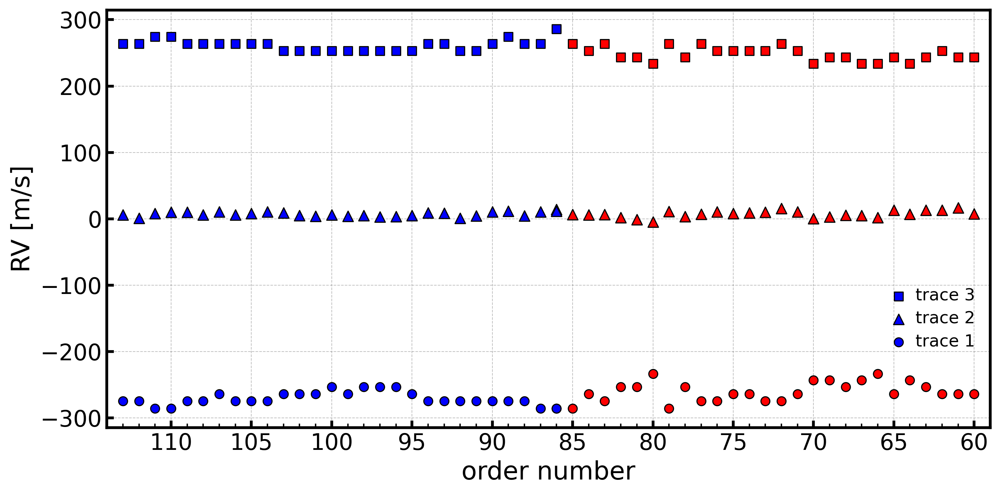

In [6]:
SNR_values = [100, 800]
scisci_frac_values = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
nspec = 1

# load and plot SNR=100
snr = 100
calsci_frac = 1e-1
plt.figure(figsize=(10, 5), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
    filename = f"{calsci_frac}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    plt.scatter(order_num['red'], rv[:, 0], s=40, edgecolors='black', marker='o', linewidths=0.8, c='red', zorder=5)
    plt.scatter(order_num['red'], rv[:, 1], s=55, edgecolors='black', marker='^', linewidths=0.8, c='red', zorder=5)
    plt.scatter(order_num['red'], rv[:, 2], s=40, edgecolors='black', marker='s', linewidths=0.8, c='red', zorder=5)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
    filename = f"{calsci_frac}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    trace1 = plt.scatter(order_num['blue'], rv[:, 0], s=40, edgecolors='black', marker='o', linewidths=0.8, c='blue', zorder=5)
    trace2 = plt.scatter(order_num['blue'], rv[:, 1], s=55, edgecolors='black', marker='^', linewidths=0.8, c='blue', zorder=5)
    trace3 = plt.scatter(order_num['blue'], rv[:, 2], s=40, edgecolors='black', marker='s', linewidths=0.8, c='blue', zorder=5)

# Major and minor x-ticks
order = np.arange(110, 59, -5)  # Major ticks
plt.xticks(order, fontsize=16)
plt.yticks(fontsize=16)
plt.gca().xaxis.set_minor_locator(plt.FixedLocator(np.linspace(60, 113, 27+27)))  # Minor ticks

# Tick formatting
plt.tick_params(axis='x', which='major', direction='in', width=2, length=5)  # Major ticks inside
plt.tick_params(axis='x', which='minor', direction='in', width=1, length=3)  # Minor ticks inside
plt.tick_params(axis='y', which='both', direction='in', width=2, length=5)  # y-ticks inside

# Thicker outer boundary
for spine in plt.gca().spines.values():
    spine.set_linewidth(2)

# Axis limits and inversion
plt.xlim(59, 114)
plt.gca().invert_xaxis()

# Labels and title
plt.xlabel('order number', fontsize=18)
plt.ylabel('RV [m/s]', fontsize=18)

# annotate the SNR and R value
# plt.annotate(f"peak SNR={snr}, contamination fraction={calsci_frac*100:.0f}%", xy=(0.05, 0.8), xycoords='axes fraction', fontsize=18)

# Grid formatting
plt.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.tight_layout()

# legend
plt.legend([trace3, trace2, trace1], ['trace 3', 'trace 2', 'trace 1'], loc='lower right', fontsize=12, frameon=False,
           ncol=1, bbox_to_anchor=(1, 0.15), labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# plt.savefig(os.path.join(pwd, 'output/paper_plots/scattered_scisci.png'), dpi=300)
plt.show()


In [7]:
ispec = 0

# extract RV precision information for contaminated trace 1
def rv_precision_calsci(scisci_frac_values):

    pre_red = np.zeros_like(scisci_frac_values, dtype=float)
    pre_blue = np.zeros_like(scisci_frac_values, dtype=float)

    rv_trace1_red = np.zeros((len(scisci_frac_values), len(order_num_red)))
    rv_trace1_blue = np.zeros((len(scisci_frac_values), len(order_num_blue)))
    rv_trace2_red = np.zeros((len(scisci_frac_values), len(order_num_red)))
    rv_trace2_blue = np.zeros((len(scisci_frac_values), len(order_num_blue)))
    rv_trace3_red = np.zeros((len(scisci_frac_values), len(order_num_red)))
    rv_trace3_blue = np.zeros((len(scisci_frac_values), len(order_num_blue)))

    for i, scisci_frac in enumerate(scisci_frac_values):
        # red
        output_folder_red = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
        filename_red = f"{scisci_frac}_{ispec}_red.npz"
        filepath_red = os.path.join(output_folder_red, filename_red)
        data_red = np.load(filepath_red)
        rv_red = data_red['RV']
        rv_trace1_red[i, :] = rv_red[:, 0]
        rv_trace2_red[i, :] = rv_red[:, 1]
        rv_trace3_red[i, :] = rv_red[:, 2]
        # blue
        output_folder_blue = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
        filename_blue = f"{scisci_frac}_{ispec}_blue.npz"
        filepath_blue = os.path.join(output_folder_blue, filename_blue)
        data_blue = np.load(filepath_blue)
        rv_blue = data_blue['RV']
        rv_trace1_blue[i, :] = rv_blue[:, 0]
        rv_trace2_blue[i, :] = rv_blue[:, 1]
        rv_trace3_blue[i, :] = rv_blue[:, 2]

    # red
    rv_median1_red = np.median(rv_trace1_red, axis=1)
    rv_std1_red = np.std(rv_trace1_red, axis=1)
    rv_median2_red = np.median(rv_trace2_red, axis=1)
    rv_std2_red = np.std(rv_trace2_red, axis=1)
    rv_median3_red = np.median(rv_trace3_red, axis=1)
    rv_std3_red = np.std(rv_trace3_red, axis=1)
    # blue
    rv_median1_blue = np.median(rv_trace1_blue, axis=1)
    rv_std1_blue = np.std(rv_trace1_blue, axis=1)
    rv_median2_blue = np.median(rv_trace2_blue, axis=1)
    rv_std2_blue = np.std(rv_trace2_blue, axis=1)
    rv_median3_blue = np.median(rv_trace3_blue, axis=1)
    rv_std3_blue = np.std(rv_trace3_blue, axis=1)

    return rv_median1_red, rv_std1_red, rv_median1_blue, rv_std1_blue, rv_median2_red, rv_std2_red, rv_median2_blue, rv_std2_blue, rv_median3_red, rv_std3_red, rv_median3_blue, rv_std3_blue

rv_median1_red, rv_std1_red, rv_median1_blue, rv_std1_blue, rv_median2_red, rv_std2_red, rv_median2_blue, rv_std2_blue, rv_median3_red, rv_std3_red, rv_median3_blue, rv_std3_blue = rv_precision_calsci(scisci_frac_values)

/tmp/ipykernel_1035924/3425004969.py:21: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax1.annotate('',
/tmp/ipykernel_1035924/3425004969.py:61: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax2.annotate('',
/tmp/ipykernel_1035924/3425004969.py:103: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax3.annotate('',
/tmp/ipykernel_1035924/3425004969.py:140: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax4.annotate('',


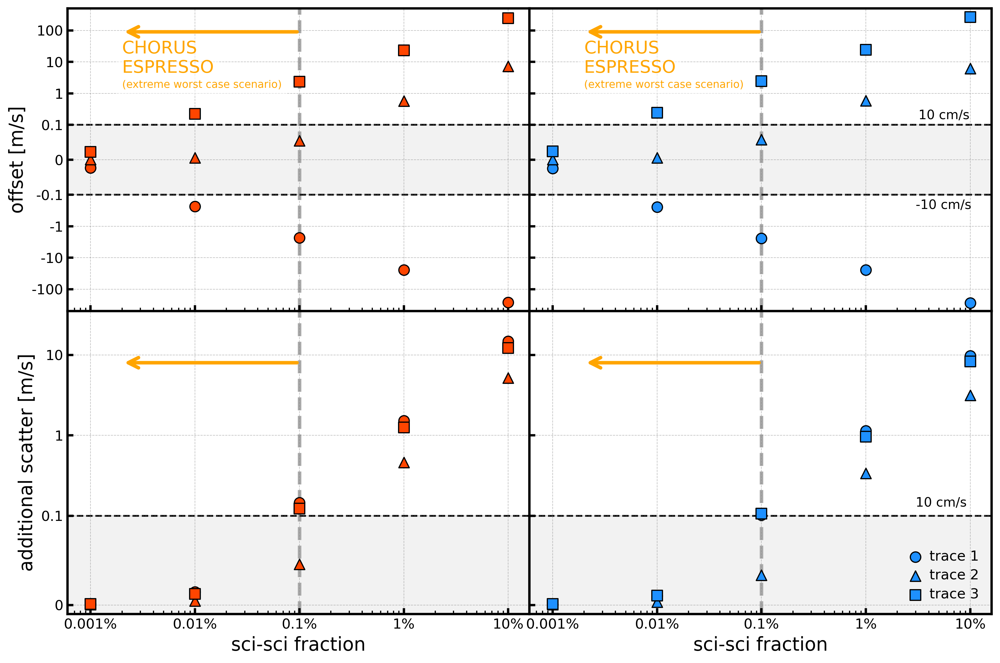

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# Create a figure and gridspec with two columns
fig = plt.figure(figsize=(12, 8), dpi=300)  # Adjust the figure size for horizontal layout
gs = fig.add_gridspec(2, 2, width_ratios=[1, 1], height_ratios=[1, 1], wspace=0, hspace=0)  # No space between plots

# ---------- Left Plot Upper Subplot ----------
ax1 = fig.add_subplot(gs[0, 0])
for i in range(len(scisci_frac_values)):
    trace1 = ax1.scatter(scisci_frac_values[i], rv_median1_red[i], marker='o', color='orangered', edgecolor='k', s=80, zorder=5)
    trace2 = ax1.scatter(scisci_frac_values[i], rv_median2_red[i], marker='^', color='orangered', edgecolor='k', s=80, zorder=5)
    trace3 = ax1.scatter(scisci_frac_values[i], rv_median3_red[i], marker='s', color='orangered', edgecolor='k', s=80, zorder=5)

# ax1.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
ax1.axvline(x=1e-3, color='darkgrey', linestyle='--', linewidth=3, zorder=1)
ax1.text(2e-5, 4.5, 'CHORUS\nESPRESSO', fontsize=15, color='orange', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5), zorder=10)
ax1.text(2e-5, 1.5, '(extreme worst case scenario)', fontsize=9, color='orange', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5), zorder=10)
ax1.annotate('', 
             fontsize=22,
             xy=(1e-3, 90),
             xytext=(2e-5, 90),
             arrowprops=dict(facecolor='orange', color='orange', arrowstyle='<-', lw=3),
             color='orange', zorder=20)

ax1.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax1.axhline(y=-0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax1.axhspan(-0.1, 0.1, color='gray', alpha=0.1, zorder=0)
ax1.set_xscale('log')
ax1.set_yscale('symlog', linthresh=0.1)
ax1.set_xlim(0.6e-5, 1.6e-1)
ax1.set_ylim(-500, 500)

# Set x and y ticks and labels
x_ticks = ['0.001%', '0.01%', '0.1%', '1%', '10%']
ax1.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
ax1.set_xticklabels([])
y_ticks = [-100, -10, -1, -0.1, 0, 0.1, 1, 10, 100]
ax1.set_yticks(y_ticks)
ax1.set_yticklabels([str(tick) for tick in y_ticks], fontsize=12)

ax1.set_ylabel('offset [m/s]', fontsize=16)
ax1.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
ax1.tick_params(axis='x', which='major', direction='in', length=5, width=2, labelbottom=False)
ax1.tick_params(axis='x', which='minor', direction='in', length=3, width=1)
ax1.tick_params(axis='y', which='major', direction='in', length=5, width=2)
for spine in ax1.spines.values():
    spine.set_linewidth(2)

# ---------- Left Plot Lower Subplot ----------
ax2 = fig.add_subplot(gs[1, 0], sharex=ax1)
for i in range(len(scisci_frac_values)):
    trace1 = ax2.scatter(scisci_frac_values[i], rv_std1_red[i], marker='o', color='orangered', edgecolor='k', s=80, zorder=5)
    trace2 = ax2.scatter(scisci_frac_values[i], rv_std2_red[i], marker='^', color='orangered', edgecolor='k', s=80, zorder=5)
    trace3 = ax2.scatter(scisci_frac_values[i], rv_std3_red[i], marker='s', color='orangered', edgecolor='k', s=80, zorder=5)

# ax2.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
ax2.axvline(x=1e-3, color='darkgrey', linestyle='--', linewidth=3, zorder=1)
ax2.annotate('', 
             fontsize=22,
             xy=(1e-3, 8),
             xytext=(2e-5, 8),
             arrowprops=dict(facecolor='orange', color='orange', arrowstyle='<-', lw=3),
             color='orange', zorder=20)

ax2.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax2.axhspan(-0.1, 0.1, color='gray', alpha=0.1, zorder=0)
ax2.set_xscale('log')
ax2.set_yscale('symlog', linthresh=0.1)
ax2.set_xlim(0.6e-5, 1.6e-1)
ax2.set_ylim(-0.01, 35.01)

# Set x and y ticks and labels
ax2.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
ax2.set_xticklabels(x_ticks, fontsize=12)
ax2.set_yticks([0, 0.1, 1, 10])
ax2.set_yticklabels([str(tick) for tick in [0, 0.1, 1, 10]], fontsize=12)

ax2.set_xlabel('sci-sci fraction', fontsize=16)
ax2.set_ylabel('additional scatter [m/s]', fontsize=16)
ax2.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
ax2.tick_params(axis='x', which='major', direction='in', length=5, width=2)
ax2.tick_params(axis='x', which='minor', direction='in', length=3, width=1)
ax2.tick_params(axis='y', which='major', direction='in', length=5, width=2)
for spine in ax2.spines.values():
    spine.set_linewidth(2)

# ---------- Right Plot Upper Subplot ----------
ax3 = fig.add_subplot(gs[0, 1], sharey=ax1)
for i in range(len(scisci_frac_values)):
    trace1 = ax3.scatter(scisci_frac_values[i], rv_median1_blue[i], marker='o', color='dodgerblue', edgecolor='k', s=80, zorder=5)
    trace2 = ax3.scatter(scisci_frac_values[i], rv_median2_blue[i], marker='^', color='dodgerblue', edgecolor='k', s=80, zorder=5)
    trace3 = ax3.scatter(scisci_frac_values[i], rv_median3_blue[i], marker='s', color='dodgerblue', edgecolor='k', s=80, zorder=5)

# ax1.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
ax3.axvline(x=1e-3, color='darkgrey', linestyle='--', linewidth=3, zorder=1)
ax3.text(2e-5, 4.5, 'CHORUS\nESPRESSO', fontsize=15, color='orange', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5), zorder=10)
ax3.text(2e-5, 1.5, '(extreme worst case scenario)', fontsize=9, color='orange', 
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.5), zorder=10)
ax3.annotate('', 
             fontsize=22,
             xy=(1e-3, 90),
             xytext=(2e-5, 90),
             arrowprops=dict(facecolor='orange', color='orange', arrowstyle='<-', lw=3),
             color='orange', zorder=20)

ax3.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax3.axhline(y=-0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax3.text(0.032, 0.15, '10 cm/s', fontsize=11, color='k', zorder=10)
ax3.text(0.03, -0.28, '-10 cm/s', fontsize=11, color='k', zorder=10)
ax3.axhspan(-0.1, 0.1, color='gray', alpha=0.1, zorder=0)
ax3.set_xscale('log')
ax3.set_xlim(0.6e-5, 1.6e-1)

# Set x and y ticks and labels
ax3.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
ax3.set_xticklabels([])
ax3.tick_params(axis='x', which='minor', direction='in', length=3, width=1)
ax3.tick_params(axis='y', labelleft=False)  # Hide y-axis labels for the right column

ax3.set_ylabel('', fontsize=16)
ax3.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
ax3.tick_params(axis='x', which='major', direction='in', length=5, width=2, labelbottom=False)
ax3.tick_params(axis='y', which='major', direction='in', length=5, width=2, labelleft=False)
for spine in ax3.spines.values():
    spine.set_linewidth(2)

# ---------- Right Plot Lower Subplot ----------
ax4 = fig.add_subplot(gs[1, 1], sharex=ax3, sharey=ax2)
for i in range(len(scisci_frac_values)):
    trace1 = ax4.scatter(scisci_frac_values[i], rv_std1_blue[i], marker='o', color='dodgerblue', edgecolor='k', s=80, zorder=5)
    trace2 = ax4.scatter(scisci_frac_values[i], rv_std2_blue[i], marker='^', color='dodgerblue', edgecolor='k', s=80, zorder=5)
    trace3 = ax4.scatter(scisci_frac_values[i], rv_std3_blue[i], marker='s', color='dodgerblue', edgecolor='k', s=80, zorder=5)

# ax4.axvspan(1e-4, 1e-3, color='lemonchiffon', zorder=1)
ax4.axvline(x=1e-3, color='darkgrey', linestyle='--', linewidth=3, zorder=1)
ax4.annotate('', 
             fontsize=22,
             xy=(1e-3, 8),
             xytext=(2e-5, 8),
             arrowprops=dict(facecolor='orange', color='orange', arrowstyle='<-', lw=3),
             color='orange', zorder=20)

ax4.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
ax4.text(0.03, 0.13, '10 cm/s', fontsize=11, color='k', zorder=10)
ax4.axhspan(-0.1, 0.1, color='gray', alpha=0.1, zorder=0)
ax4.set_xscale('log')
ax4.set_xlim(0.6e-5, 1.6e-1)

# Set x and y ticks and labels
ax4.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1])
ax4.set_xticklabels(x_ticks, fontsize=12)
ax4.tick_params(axis='x', which='minor', direction='in', length=3, width=1)
ax4.tick_params(axis='y', labelleft=False)  # Hide y-axis labels for the right column

ax4.set_xlabel('sci-sci fraction', fontsize=16)
ax4.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
ax4.tick_params(axis='x', which='major', direction='in', length=5, width=2)
ax4.tick_params(axis='y', which='major', direction='in', length=5, width=2, labelleft=False)
for spine in ax4.spines.values():
    spine.set_linewidth(2)

# Add a legend to the lower plot
ax4.legend([trace1, trace2, trace3], ['trace 1', 'trace 2', 'trace 3'], loc='lower right', fontsize=12, frameon=False,
          ncol=1, bbox_to_anchor=(1, 0), labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Add a thicker outer boundary for the entire figure
# fig.patch.set_linewidth(2)
# fig.patch.set_edgecolor('black')

# Adjust layout and show the plot
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/results_scisci.png'), dpi=600)
plt.show()



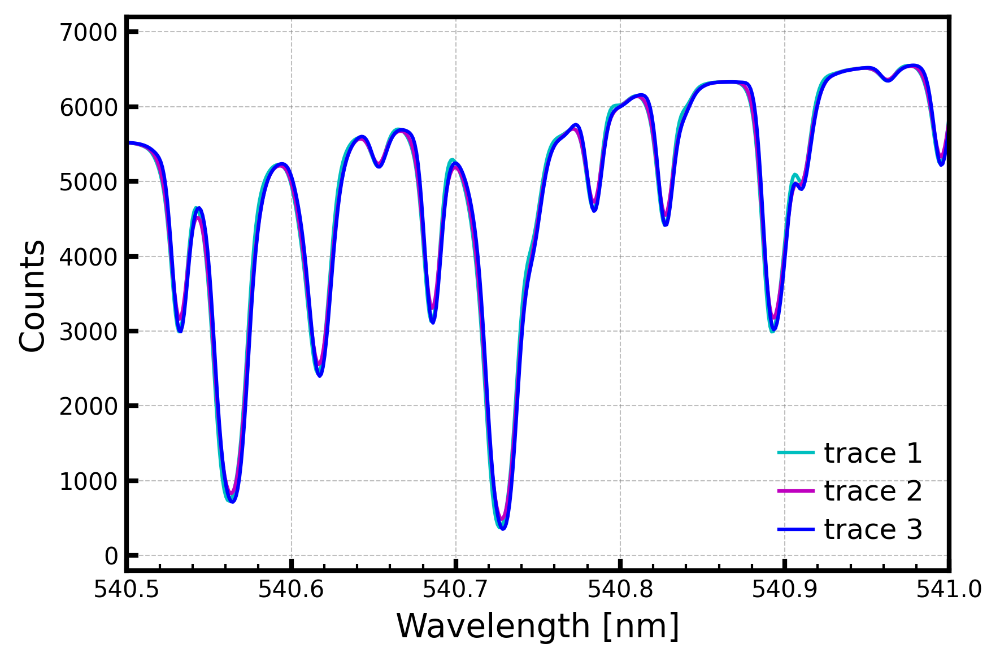

In [62]:
# Load the data
snr = 100
scisci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [540.5, 541]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

# Create the figure
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)

# Plot the data
ax.plot(data['wavelength'][-1, 0, :], data['flux'][-1, 0, :], linewidth=1.5, color='c', label='trace 1')
ax.plot(data['wavelength'][-1, 1, :], data['flux'][-1, 1, :], linewidth=1.5, color='m', label='trace 2')
ax.plot(data['wavelength'][-1, 2, :], data['flux'][-1, 2, :], linewidth=1.5, color='b', label='trace 3')

# Set x and y limits
ax.set_xlim(wave_lim[0], wave_lim[1])
ax.set_ylim(-200, 7200)

# Set axis labels
ax.set_xlabel('Wavelength [nm]', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(wave_lim[0], wave_lim[1], 0.02)))

# Add grid
ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

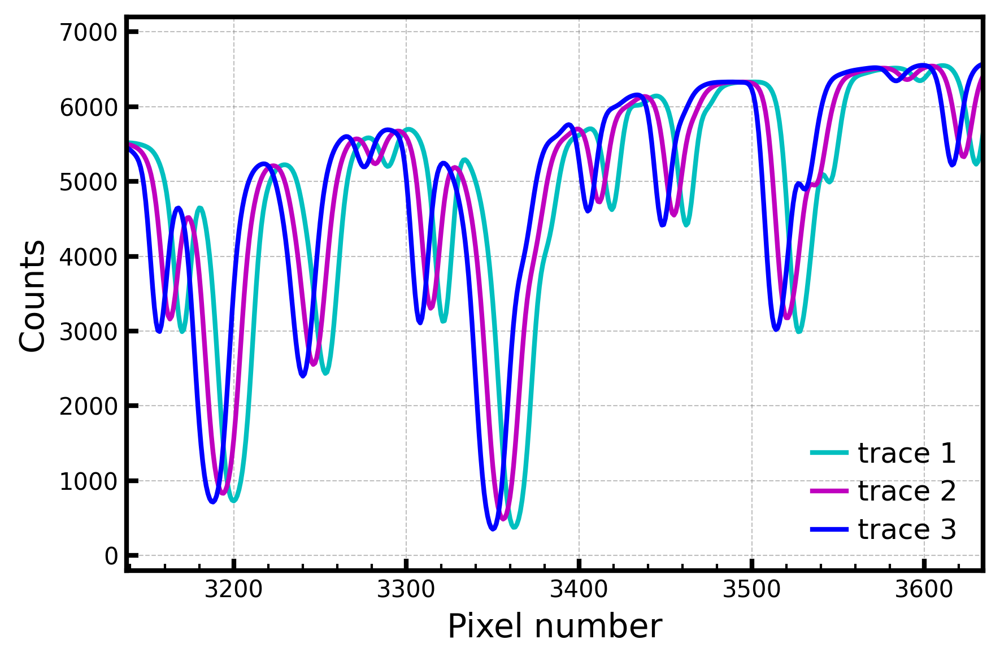

In [49]:
# Load the data
snr = 100
scisci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
filename = f"{scisci_frac}_{ispec}_{band}.npz"
filepath = os.path.join(output_folder, filename)
data = np.load(filepath)

wave_lim = [540.5, 541]
ind = (data['wavelength'][-1, 0, :] > wave_lim[0]) & (data['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind = [np.min(np.where(ind)), np.max(np.where(ind))]
pix_lim = [data['wavelength'][-1, 0, :][pix_ind[0]], data['wavelength'][-1, 0, :][pix_ind[1]]]

# Create the figure
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)

# Plot the data
ax.plot(range(1, 8001), data['flux'][-1, 0, :], linewidth=2, color='c', label='trace 1')
ax.plot(range(1, 8001), data['flux'][-1, 1, :], linewidth=2, color='m', label='trace 2')
ax.plot(range(1, 8001), data['flux'][-1, 2, :], linewidth=2, color='b', label='trace 3')

# Set x and y limits
ax.set_xlim(pix_ind[0], pix_ind[1])
ax.set_ylim(-200, 7200)

# Set axis labels
ax.set_xlabel('Pixel number', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(3100, 3700, 20)))

# Add grid
ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


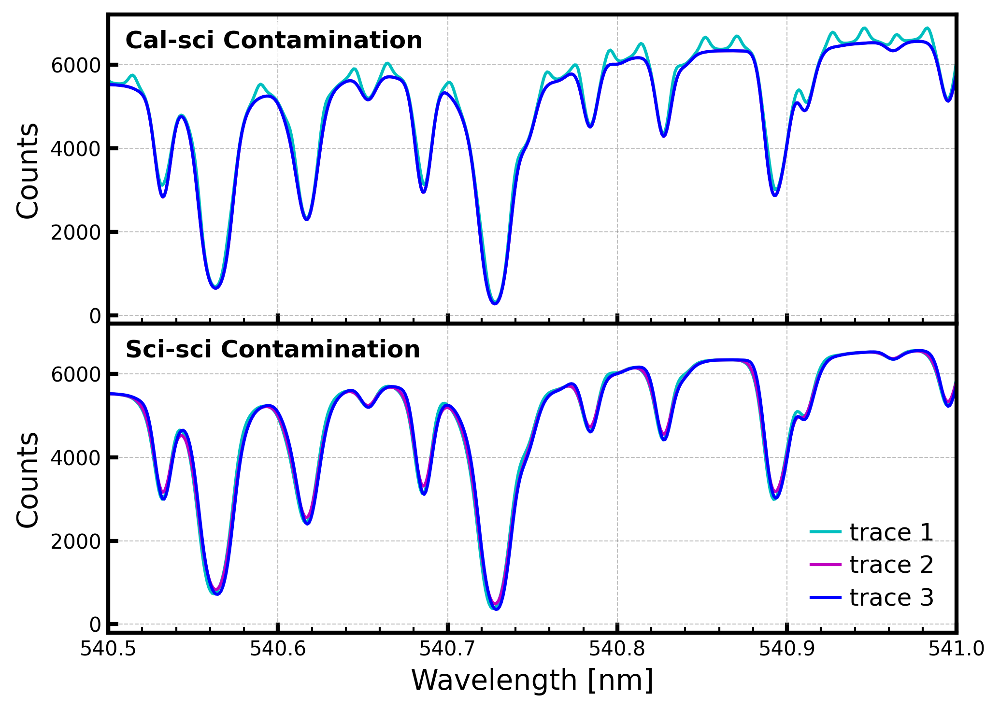

In [69]:
# Load data for the upper plot
snr = 100
scisci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename_upper = f"{scisci_frac}_{ispec}_{band}.npz"
filepath_upper = os.path.join(output_folder, filename_upper)
data_upper = np.load(filepath_upper)

# Load data for the lower plot
output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
filename_lower = f"{scisci_frac}_{ispec}_{band}.npz"
filepath_lower = os.path.join(output_folder, filename_lower)
data_lower = np.load(filepath_lower)

# Define common limits
wave_lim = [540.5, 541]
ind_upper = (data_upper['wavelength'][-1, 0, :] > wave_lim[0]) & (data_upper['wavelength'][-1, 0, :] < wave_lim[1])
ind_lower = (data_lower['wavelength'][-1, 0, :] > wave_lim[0]) & (data_lower['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind_upper = [np.min(np.where(ind_upper)), np.max(np.where(ind_upper))]
pix_ind_lower = [np.min(np.where(ind_lower)), np.max(np.where(ind_lower))]
pix_lim_upper = [data_upper['wavelength'][-1, 0, :][pix_ind_upper[0]], data_upper['wavelength'][-1, 0, :][pix_ind_upper[1]]]
pix_lim_lower = [data_lower['wavelength'][-1, 0, :][pix_ind_lower[0]], data_lower['wavelength'][-1, 0, :][pix_ind_lower[1]]]

# Create the figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(7, 5), dpi=300, sharex=True, gridspec_kw={'hspace': 0})

# ---------- Upper Plot ----------
ax = axs[0]
ax.plot(data_upper['wavelength'][-1, 0, :], data_upper['flux'][-1, 0, :], linewidth=1.5, color='c', label='trace 1')
ax.plot(data_upper['wavelength'][-1, 1, :], data_upper['flux'][-1, 1, :], linewidth=1.5, color='m', label='trace 2')
ax.plot(data_upper['wavelength'][-1, 2, :], data_upper['flux'][-1, 2, :], linewidth=1.5, color='b', label='trace 3')

ax.set_xlim(wave_lim[0], wave_lim[1])
ax.set_ylim(-200, 7200)

# Add in-plot subtitle
ax.text(0.02, 0.95, 'Cal-sci Contamination', transform=ax.transAxes, fontsize=12, fontweight='bold', color='black', 
        ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(wave_lim[0], wave_lim[1], 0.02)))

ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
# ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
#           labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# ---------- Lower Plot ----------
ax = axs[1]
ax.plot(data_lower['wavelength'][-1, 0, :], data_lower['flux'][-1, 0, :], linewidth=1.5, color='c', label='trace 1')
ax.plot(data_lower['wavelength'][-1, 1, :], data_lower['flux'][-1, 1, :], linewidth=1.5, color='m', label='trace 2')
ax.plot(data_lower['wavelength'][-1, 2, :], data_lower['flux'][-1, 2, :], linewidth=1.5, color='b', label='trace 3')

ax.set_xlim(wave_lim[0], wave_lim[1])
ax.set_ylim(-200, 7200)

# Add in-plot subtitle
ax.text(0.02, 0.95, 'Sci-sci Contamination', transform=ax.transAxes, fontsize=12, fontweight='bold', color='black', 
        ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

ax.set_xlabel('Wavelength [nm]', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(wave_lim[0], wave_lim[1], 0.02)))

ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# Thicker outer boundary for the entire figure
# fig.patch.set_linewidth(2)
# fig.patch.set_edgecolor('black')

# Adjust layout and show the plot
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/contamination_wave.png'), dpi=600)
plt.show()


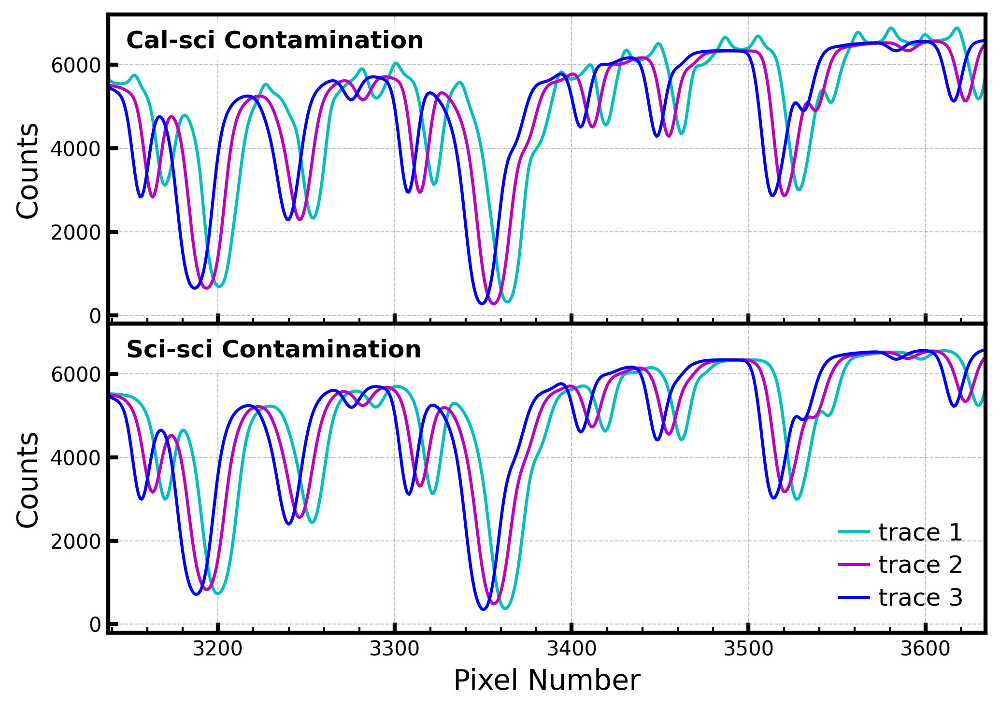

In [ ]:
# Load data for the upper plot
snr = 100
scisci_frac = 1e-1
band = 'red'
ispec = 0
output_folder = os.path.join(pwd, f"output/synfile_calsci/snr{snr}")
filename_upper = f"{scisci_frac}_{ispec}_{band}.npz"
filepath_upper = os.path.join(output_folder, filename_upper)
data_upper = np.load(filepath_upper)

# Load data for the lower plot
output_folder = os.path.join(pwd, f"output/synfile_scisci/snr{snr}")
filename_lower = f"{scisci_frac}_{ispec}_{band}.npz"
filepath_lower = os.path.join(output_folder, filename_lower)
data_lower = np.load(filepath_lower)

# Define common limits
wave_lim = [540.5, 541]
ind_upper = (data_upper['wavelength'][-1, 0, :] > wave_lim[0]) & (data_upper['wavelength'][-1, 0, :] < wave_lim[1])
ind_lower = (data_lower['wavelength'][-1, 0, :] > wave_lim[0]) & (data_lower['wavelength'][-1, 0, :] < wave_lim[1])
pix_ind_upper = [np.min(np.where(ind_upper)), np.max(np.where(ind_upper))]
pix_ind_lower = [np.min(np.where(ind_lower)), np.max(np.where(ind_lower))]
pix_lim_upper = [data_upper['wavelength'][-1, 0, :][pix_ind_upper[0]], data_upper['wavelength'][-1, 0, :][pix_ind_upper[1]]]
pix_lim_lower = [data_lower['wavelength'][-1, 0, :][pix_ind_lower[0]], data_lower['wavelength'][-1, 0, :][pix_ind_lower[1]]]

# Create the figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(7, 5), dpi=300, sharex=True, gridspec_kw={'hspace': 0})

# ---------- Upper Plot ----------
ax = axs[0]
ax.plot(range(1, 8001), data_upper['flux'][-1, 0, :], linewidth=1.5, color='c', label='trace 1')
ax.plot(range(1, 8001), data_upper['flux'][-1, 1, :], linewidth=1.5, color='m', label='trace 2')
ax.plot(range(1, 8001), data_upper['flux'][-1, 2, :], linewidth=1.5, color='b', label='trace 3')

ax.set_xlim(pix_ind_upper[0], pix_ind_upper[1])
ax.set_ylim(-200, 7200)

# Add in-plot subtitle
ax.text(0.02, 0.95, 'Cal-sci Contamination', transform=ax.transAxes, fontsize=12, fontweight='bold', color='black', 
        ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(3100, 3700, 20)))

ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
# ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
#           labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# ---------- Lower Plot ----------
ax = axs[1]
ax.plot(range(1, 8001), data_lower['flux'][-1, 0, :], linewidth=1.5, color='c', label='trace 1')
ax.plot(range(1, 8001), data_lower['flux'][-1, 1, :], linewidth=1.5, color='m', label='trace 2')
ax.plot(range(1, 8001), data_lower['flux'][-1, 2, :], linewidth=1.5, color='b', label='trace 3')

ax.set_xlim(pix_ind_lower[0], pix_ind_lower[1])
ax.set_ylim(-200, 7200)

# Add in-plot subtitle
ax.text(0.02, 0.95, 'Sci-sci Contamination', transform=ax.transAxes, fontsize=12, fontweight='bold', color='black', 
        ha='left', va='top', bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

ax.set_xlabel('Pixel Number', fontsize=14)
ax.set_ylabel('Counts', fontsize=14)
ax.xaxis.set_minor_locator(plt.FixedLocator(np.arange(3100, 3700, 20)))

ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

# Major and minor tick settings
ax.tick_params(axis='x', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='x', which='minor', direction='in', width=1, length=3)
ax.tick_params(axis='y', which='major', direction='in', width=2, length=5)
ax.tick_params(axis='y', which='minor', direction='in', width=1, length=3)

# Add legend
ax.legend(fontsize=12, frameon=False, loc='lower right', ncol=1,
          labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Thicker outer boundary
for spine in ax.spines.values():
    spine.set_linewidth(2)

# Thicker outer boundary for the entire figure
# fig.patch.set_linewidth(2)
# fig.patch.set_edgecolor('black')

# Adjust layout and show the plot
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/contamination_pixel.png'), dpi=600)
plt.show()


## 4. CHORUS setting

SNR=600, RV median in the red band: 0.022241444568439798m/s, std: 0.11956437182406056m/s
SNR=600, RV median in the blue band: 0.05293146738228845m/s, std: 0.06659104163603893m/s


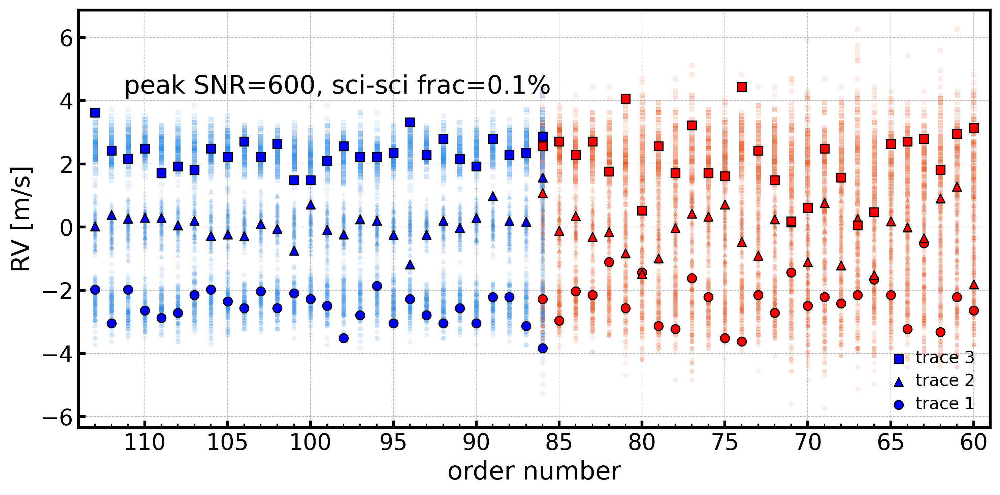

In [35]:
SNR_values = np.arange(100, 801, 100)
scisci_frac_values = [1e-3, 1e-4]
nspec = 100
R = 120000

# load and plot SNR=100
snr = 600
scisci_frac = 1e-3
rv_all_red = np.zeros((nspec, len(order_num_red), 3))
rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
plt.figure(figsize=(10, 5), dpi=300)
# red band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_CHORUS/snr{snr}")
    filename = f"{scisci_frac}_{ispec}_red.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_red[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        plt.scatter(order_num['red'], rv[:, 0], marker='o', s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 1], marker='^', s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
        plt.scatter(order_num['red'], rv[:, 2], marker='s', s=40, edgecolors='black', linewidths=0.8, c='red', zorder=5)
    else:
        plt.scatter(order_num['red'], rv[:, 0], marker='o', s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 1], marker='^', s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
        plt.scatter(order_num['red'], rv[:, 2], marker='s', s=10, edgecolors='gray', linewidth=0.2, c='orangered', alpha=0.1, zorder=3)
# blue band
for ispec in range(nspec):
    output_folder = os.path.join(pwd, f"output/synfile_CHORUS/snr{snr}")
    filename = f"{scisci_frac}_{ispec}_blue.npz"
    filepath = os.path.join(output_folder, filename)
    data = np.load(filepath)
    rv = data['RV']
    rv_all_blue[ispec, :, :] = rv
    # mark the first observation
    if ispec == 0:
        trace1 = plt.scatter(order_num['blue'], rv[:, 0], marker='o', s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        trace2 = plt.scatter(order_num['blue'], rv[:, 1], marker='^', s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
        trace3 = plt.scatter(order_num['blue'], rv[:, 2], marker='s', s=40, edgecolors='black', linewidths=0.8, c='blue', zorder=5)
    else:
        plt.scatter(order_num['blue'], rv[:, 0], marker='o', s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 1], marker='^', s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)
        plt.scatter(order_num['blue'], rv[:, 2], marker='s', s=10, edgecolors='gray', linewidth=0.2, c='dodgerblue', alpha=0.1, zorder=3)

# concatenate the red band into the shape of (nspec*3, len(order)), joining 3 traces for one order
# calculate the median and std of each order, combining three traces for one order
# red band
rv_all_red_transformed = np.hstack(rv_all_red[:, :, :])
rv_median_red = np.median(rv_all_red_transformed, axis=1)
rv_std_red = np.std(rv_all_red_transformed, axis=1)
# plt.errorbar(order_num['red'], rv_median_red, yerr=rv_std_red, fmt='o', color='red', ms=10, elinewidth=2, capsize=3, capthick=2, label='Red band', zorder=5)
# blue band
rv_all_blue_transformed = np.hstack(rv_all_blue[:, :, :])
rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
rv_std_blue = np.std(rv_all_blue_transformed, axis=1)
# plt.errorbar(order_num['blue'], rv_median_blue, yerr=rv_std_blue, fmt='o', color='blue', ms=10, elinewidth=2, capsize=3, capthick=2, label='Blue band', zorder=5)

print(f"SNR={snr}, RV median in the red band: {np.median(rv_median_red)}m/s, std: {np.std(rv_median_red)}m/s")
print(f"SNR={snr}, RV median in the blue band: {np.median(rv_median_blue)}m/s, std: {np.std(rv_median_blue)}m/s")

# Major and minor x-ticks
order = np.arange(110, 59, -5)  # Major ticks
plt.xticks(order, fontsize=16)
plt.yticks(fontsize=16)
plt.gca().xaxis.set_minor_locator(plt.FixedLocator(np.linspace(60, 113, 27+27)))  # Minor ticks

# Tick formatting
plt.tick_params(axis='x', which='major', direction='in', width=2, length=5)  # Major ticks inside
plt.tick_params(axis='x', which='minor', direction='in', width=1, length=3)  # Minor ticks inside
plt.tick_params(axis='y', which='both', direction='in', width=2, length=5)  # y-ticks inside

# Thicker outer boundary
for spine in plt.gca().spines.values():
    spine.set_linewidth(2)

# Axis limits and inversion
plt.xlim(59, 114)
plt.gca().invert_xaxis()

# Labels and title
plt.xlabel('order number', fontsize=18)
plt.ylabel('RV [m/s]', fontsize=18)

# annotate the SNR and R value
plt.annotate(f"peak SNR={snr}, sci-sci frac=0.1%", xy=(0.05, 0.8), xycoords='axes fraction', fontsize=18)

# legend
plt.legend([trace3, trace2, trace1], ['trace 3', 'trace 2', 'trace 1'], loc='lower right', fontsize=12, frameon=False,
           ncol=1, bbox_to_anchor=(1, 0), labelspacing=0.4, columnspacing=1, handletextpad=0.4, handlelength=1.2)

# Grid formatting
plt.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/scattered_CHORUS.png'), dpi=300)
plt.show()


This cell might take several minutes to read in the data, but you can save it as a npz file as I show below.

In [72]:
# extract RV precision information
def rv_precision_cont(snr_values, R):

    pre_red = np.zeros_like(snr_values, dtype=float)
    pre_blue = np.zeros_like(snr_values, dtype=float)

    for i, snr in enumerate(snr_values):
        rv_all_red = np.zeros((nspec, len(order_num_red), 3))
        rv_all_blue = np.zeros((nspec, len(order_num_blue), 3))
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_CHORUS/snr{snr}")
            filename = f"{R}_{ispec}_red.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_red[ispec, :, :] = rv
        for ispec in range(nspec):
            output_folder = os.path.join(pwd, f"output/synfile_CHORUS/snr{snr}")
            filename = f"{R}_{ispec}_blue.npz"
            filepath = os.path.join(output_folder, filename)
            data = np.load(filepath)
            rv = data['RV']
            rv_all_blue[ispec, :, :] = rv
        # red
        rv_all_red_transformed = np.hstack([rv_all_red[:, :, j] for j in range(3)])  # with shape (nspec, len(order)*3)
        rv_median_red = np.median(rv_all_red_transformed, axis=1)  # with shape (nspec,)
        # blue
        rv_all_blue_transformed = np.hstack([rv_all_blue[:, :, j] for j in range(3)])
        rv_median_blue = np.median(rv_all_blue_transformed, axis=1)
        # precision
        # std
        pre_red[i] = np.std(rv_median_red)
        pre_blue[i] = np.std(rv_median_blue)
        # MAD
        # pre_red[i] = mad(rv_median_red)
        # pre_blue[i] = mad(rv_median_blue)

    return pre_red, pre_blue

pre_red_conservative, pre_blue_conservative = rv_precision_cont(SNR_values, 1e-3)
pre_red_optimize, pre_blue_optimize = rv_precision_cont(SNR_values, 1e-4)

KeyboardInterrupt: 

In [16]:
np.savez('rv_precision_cont.npz', pre_red_conservative=pre_red_conservative, pre_blue_conservative=pre_blue_conservative, pre_red_optimize=pre_red_optimize, pre_blue_optimize=pre_blue_optimize)

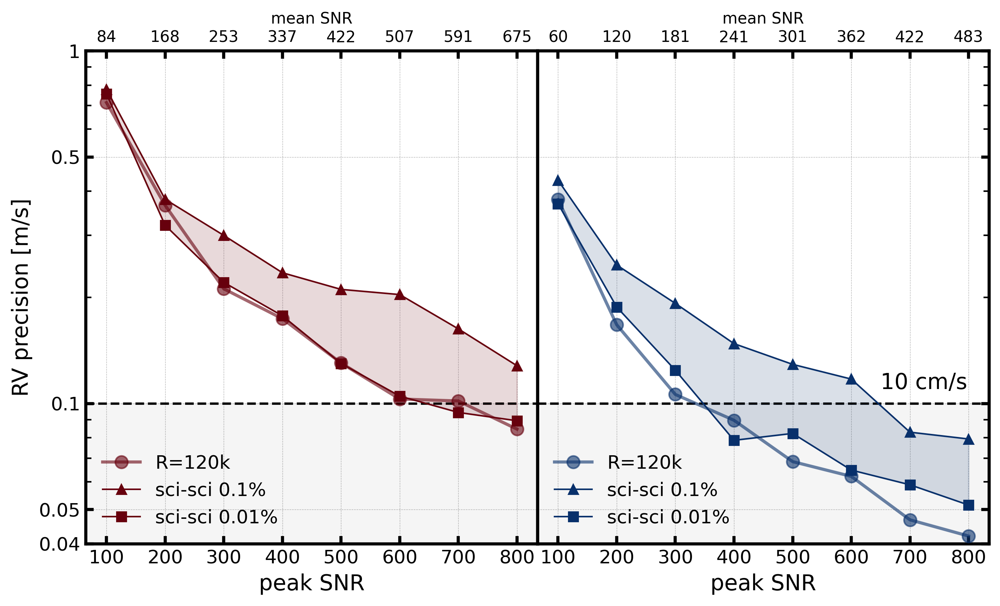

In [ ]:
# Load data
pre_red_12 = np.load('rv_precision_matrix.npz')['pre_red'][0:8, 4]
pre_blue_12 = np.load('rv_precision_matrix.npz')['pre_blue'][0:8, 4]

# Set SNR values for x-axis
SNR_values = np.arange(100, 801, 100)

# color
color_r = plt.cm.Reds((4 + 3) / 6)
color_b = plt.cm.Blues((4 + 3) / 6)

# Create the figure and subplots with shared Y-axis and no space between
fig, axes = plt.subplots(1, 2, figsize=(9, 5.5), dpi=300, sharey=True, gridspec_kw={'wspace': 0})

# ---------- Left Plot ----------
ax_left = axes[0]
ax_left.plot(SNR_values, pre_red_12, 'o-', label='R=120k', color=color_r, linewidth=2, ms=8, zorder=10, alpha=0.6)
ax_left.plot(SNR_values, pre_red_conservative, '^-', label='0.1%', linewidth=1, ms=6, color=color_r, zorder=6)
ax_left.plot(SNR_values, pre_red_optimize, 's-', label='0.01%', linewidth=1, ms=6, color=color_r, zorder=6)
ax_left.fill_between(SNR_values, pre_red_conservative, pre_red_optimize, color=color_r, alpha=0.15, zorder=3)

# Mark <10 cm/s area
ax_left.axhspan(0.01, 0.1, color='whitesmoke', zorder=0)
ax_left.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)

# Add annotation for 10 cm/s
# ax_left.annotate('10 cm/s', xy=(650, 0.11), fontsize=14, color='k', zorder=10)

# Grid and tick parameters
ax_left.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
ax_left.tick_params(axis='both', which='major', width=2, length=5, direction='in')

# ---------- Right Plot ----------
ax_right = axes[1]
ax_right.plot(SNR_values, pre_blue_12, 'o-', label='R=120k', color=color_b, linewidth=2, ms=8, zorder=10, alpha=0.6)
ax_right.plot(SNR_values, pre_blue_conservative, '^-', label='0.1%', linewidth=1, ms=6, color=color_b, zorder=6)
ax_right.plot(SNR_values, pre_blue_optimize, 's-', label='0.01%', linewidth=1, ms=6, color=color_b, zorder=6)
ax_right.fill_between(SNR_values, pre_blue_conservative, pre_blue_optimize, color=color_b, alpha=0.15, zorder=3)

# Mark <10 cm/s area
ax_right.axhspan(0.01, 0.1, color='whitesmoke', zorder=0)
ax_right.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)

# Add annotation for 10 cm/s
ax_right.annotate('10 cm/s', xy=(650, 0.11), fontsize=14, color='k', zorder=10)

# Grid and tick parameters
ax_right.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5, zorder=0)
ax_right.tick_params(axis='both', which='major', width=2, length=5, direction='in')

# ---------- axes ----------
# Formatting for both subplots
for ax in axes:
    ax.set_yscale('log')
    ax.set_yticks([0.04, 0.05, 0.1, 0.5, 1])
    ax.set_yticklabels([0.04, 0.05, 0.1, 0.5, 1], fontsize=12)
    ax.set_ylim(0.04, 1)
    ax.set_xticks(np.arange(100, 801, 100))
    ax.set_xticklabels([f"{x:.0f}" for x in np.arange(100, 801, 100)], fontsize=12)
    ax.tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
    ax.tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
    ax.grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

# Left plot adjustments
axes[0].set_xlabel('peak SNR', fontsize=14)
axes[0].set_ylabel('RV precision [m/s]', fontsize=14)

# Right plot adjustments
axes[1].tick_params(left=False, labelleft=False)  # Remove left y-axis labels and ticks

# Move right y-ticks to the right side without labels
axes[1].yaxis.tick_right()
axes[1].tick_params(axis='y', which='both', labelright=False)  # Keep ticks but hide labels
axes[1].set_xlabel('peak SNR', fontsize=14)

# ---------- Upper X-Axes ----------
# Left plot
ax_top_left = ax_left.twiny()
ax_top_left.set_xticks(SNR_values)
ax_top_left.set_xticklabels([f"{int(x)}" for x in mean_SNR_red[0:8]], fontsize=10)
ax_top_left.tick_params(axis='x', which='major', direction='in', length=5, width=2)
ax_top_left.set_xlim(ax_left.get_xlim())
ax_top_left.set_xlabel('mean SNR', fontsize=10)

# Right plot
ax_top_right = ax_right.twiny()
ax_top_right.set_xticks(SNR_values)
ax_top_right.set_xticklabels([f"{int(x)}" for x in mean_SNR_blue[0:8]], fontsize=10)
ax_top_right.tick_params(axis='x', which='major', direction='in', length=5, width=2)
ax_top_right.set_xlim(ax_right.get_xlim())
ax_top_right.set_xlabel('mean SNR', fontsize=10)

# ---------- Legends ----------
ax_left.legend(['R=120k', 'sci-sci 0.1%', 'sci-sci 0.01%'], fontsize=12, loc='lower left', frameon=False)
ax_right.legend(['R=120k', 'sci-sci 0.1%', 'sci-sci 0.01%'], fontsize=12, loc='lower left', frameon=False)

# ---------- Outer Boundary ----------
for ax in [ax_left, ax_right]:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

# Adjust layout and display
plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/std_SNR_CHORUS1.png'), dpi=600)
plt.show()


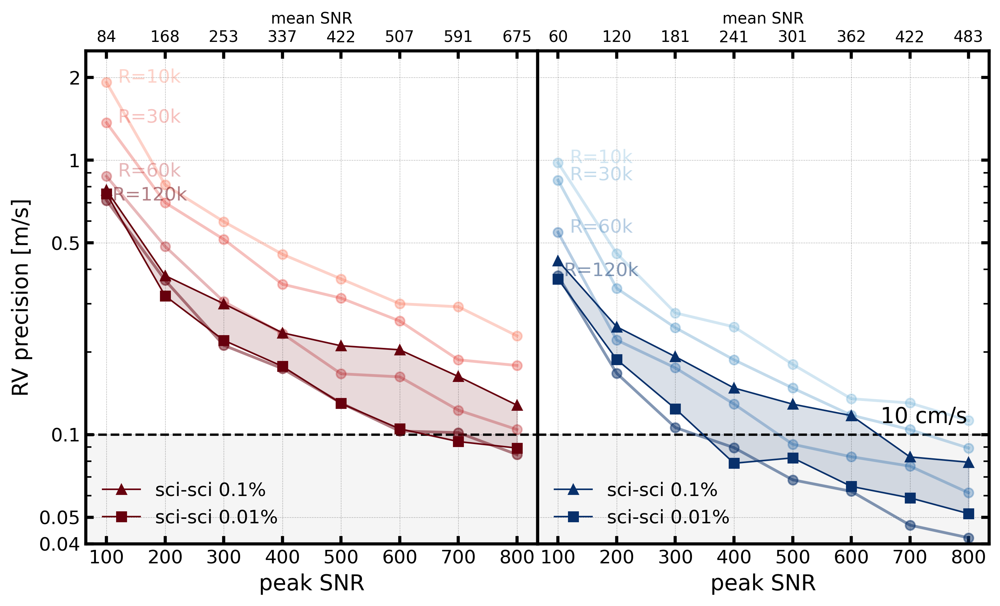

In [65]:
R_values = [10000, 30000, 60000, 90000, 120000, 150000]

# Plot setup with shared y-axis and no space between subplots
fig, axes = plt.subplots(1, 2, figsize=(9, 5.5), dpi=300, sharey=True, gridspec_kw={'wspace': 0, 'hspace': 0})

for i, iR in enumerate(R_values):
    color_red = plt.cm.Reds((i + 3) / (len(R_values)))
    color_blue = plt.cm.Blues((i + 3) / (len(R_values)))

    # Left subplot: Red band
    ax = axes[0]
    if iR in [10000, 30000, 60000, 120000]:
        if iR != 120000:
            ax.plot(np.arange(100, 801, 100), pre_red[0:8, i], 'o-', label=f'R={iR}', color=color_red, linewidth=1.8, ms=6, alpha=0.3)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_red[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_red, fontsize=12, alpha=0.3)
        else:
            ax.plot(np.arange(100, 801, 100), pre_red[0:8, i], 'o-', label=f'R={iR}', color=color_red, linewidth=1.8, ms=6, alpha=0.5)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_red[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_red, fontsize=12, alpha=0.5)

    # Right subplot: Blue band
    ax = axes[1]
    if iR in [10000, 30000, 60000, 120000]:
        if iR != 120000:
            ax.plot(np.arange(100, 801, 100), pre_blue[0:8, i], 'o-', label=f'R={iR}', color=color_blue, linewidth=1.8, ms=6, alpha=0.3)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_blue[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_blue, fontsize=12, alpha=0.3)
        else:
            ax.plot(np.arange(100, 801, 100), pre_blue[0:8, i], 'o-', label=f'R={iR}', color=color_blue, linewidth=1.8, ms=6, alpha=0.5)
            ax.annotate(f"R={iR/1000:.0f}k", (np.arange(100, 801, 100)[0] + 60, pre_blue[0, i]), textcoords="offset points", xytext=(5, 0), ha='center', color=color_blue, fontsize=12, alpha=0.5)

red_cons = axes[0].plot(SNR_values, pre_red_conservative, '^-', label='0.1%', linewidth=1, ms=6, color=color_r, zorder=6)[0]
red_opti = axes[0].plot(SNR_values, pre_red_optimize, 's-', label='0.01%', linewidth=1, ms=6, color=color_r, zorder=6)[0]
axes[0].fill_between(SNR_values, pre_red_conservative, pre_red_optimize, color=color_r, alpha=0.15, zorder=1)
blue_cons = axes[1].plot(SNR_values, pre_blue_conservative, '^-', label='0.1%', linewidth=1, ms=6, color=color_b, zorder=6)[0]
blue_opti = axes[1].plot(SNR_values, pre_blue_optimize, 's-', label='0.01%', linewidth=1, ms=6, color=color_b, zorder=6)[0]
axes[1].fill_between(SNR_values, pre_blue_conservative, pre_blue_optimize, color=color_b, alpha=0.15, zorder=1)

# fill the < 0.1m/s area
for ax in axes:
    ax.axhspan(0.01, 0.1, color='whitesmoke', zorder=0)
    ax.axhline(y=0.1, color='k', linestyle='--', linewidth=1.5, zorder=1)
axes[1].annotate('10 cm/s', xy=(650, 0.11), fontsize=14, color='k', zorder=10)

# Formatting for both subplots
for ax in axes:
    ax.set_yscale('log')
    ax.set_yticks([0.04, 0.05, 0.1, 0.5, 1, 2])
    ax.set_yticklabels([0.04, 0.05, 0.1, 0.5, 1, 2], fontsize=12)
    ax.set_ylim(0.04, 2.5)
    ax.set_xticks(np.arange(100, 801, 100))
    ax.set_xticklabels([f"{x:.0f}" for x in np.arange(100, 801, 100)], fontsize=12)
    ax.tick_params(axis='both', which='major', width=2, length=5, direction='in')  # Thicker ticks
    ax.tick_params(axis='both', which='minor', width=1, length=3.5, direction='in')  # Thicker ticks
    ax.grid(True, linestyle='--', color='k', linewidth=0.3, alpha=0.3)

# Left plot adjustments
axes[0].set_xlabel('peak SNR', fontsize=14)
axes[0].set_ylabel('RV precision [m/s]', fontsize=14)

# Right plot adjustments
axes[1].tick_params(left=False, labelleft=False)  # Remove left y-axis labels and ticks

# Move right y-ticks to the right side without labels
axes[1].yaxis.tick_right()
axes[1].tick_params(axis='y', which='both', labelright=False)  # Keep ticks but hide labels
axes[1].set_xlabel('peak SNR', fontsize=14)

# Left subplot
ax_top_left = axes[0].twiny()
ax_top_left.set_xticks(np.arange(100, 801, 100))
ax_top_left.set_xticklabels([int(i) for i in mean_SNR_red[0:8]], fontsize=10)
ax_top_left.tick_params(
                        axis='x', 
                        which='major', 
                        direction='in', 
                        length=5,  # Match the bottom ticks
                        width=2    # Match the bottom ticks
                    )
ax_top_left.set_xlim(axes[0].get_xlim())
ax_top_left.set_xlabel('mean SNR', fontsize=10)

# Right subplot
ax_top_right = axes[1].twiny()
ax_top_right.set_xticks(np.arange(100, 801, 100))
ax_top_right.set_xticklabels([int(i) for i in mean_SNR_blue[0:8]], fontsize=10)
ax_top_right.tick_params(
                        axis='x', 
                        which='major', 
                        direction='in', 
                        length=5,  # Match the bottom ticks
                        width=2    # Match the bottom ticks
                    )
ax_top_right.set_xlim(axes[1].get_xlim())
ax_top_right.set_xlabel('mean SNR', fontsize=10)


# Thicker outer boundary for each subplot
for ax in axes:
    for spine in ax.spines.values():
        spine.set_linewidth(2)

axes[0].legend([red_cons, red_opti], ['sci-sci 0.1%', 'sci-sci 0.01%'], fontsize=12, loc='lower left', frameon=False)
axes[1].legend([blue_cons, blue_opti], ['sci-sci 0.1%', 'sci-sci 0.01%'], fontsize=12, loc='lower left', frameon=False)

plt.tight_layout()

# plt.savefig(os.path.join(pwd, 'output/paper_plots/std_SNR_CHORUS2.png'), dpi=600)
plt.show()